# Table of Contents

0. [Section 0: Data Import](#section-0-data-import)
1. [Section 1: Data Distribution](#section-1-data-distribution)
2. [Section 2: Aggregated Dynamics of Sentiment and Polarisation (2001-2025)](#section-2-aggregated-dynamics-of-sentiment-and-polarisation-2001-2025)
    * [2.1 Sentiment and Polaristation over Time](#section-21-sentiment-and-polaristation-over-time)
    * [2.2 Topic-Level Dynamics and Polarisation](#section-22-topic-level-dynamics-and-polarisation)
    * [2.3 Inter-Topic Structure: Correlation, PCA and Clusters](#section-23-inter-topic-structure-correlation-pca-and-clusters)
    * [2.4 Event Selection and Design](#section-24-event-selection-and-design)
    * [2.5 GLSAR](#section-25-glsar)


## 0. Section 0: Data Import
<a name="section-0-data-import"></a>



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

pd.set_option('display.max_columns', 50)
sns.set_style("whitegrid")

print("Mounting Google Drive...")
drive.mount('/content/drive')

file_pathSamira = '/content/drive/MyDrive/congress_data/final_merged_analysis.csv'
file_pathManuel = '/content/drive/MyDrive/congress_data/final_merged_analysis.csv'
file_pathEnea = '/content/drive/MyDrive/congress_data/final_merged_analysis.csv'
file_pathLeon = '/content/drive/MyDrive/congress_data/final_merged_analysis.csv'

try:
    df = pd.read_csv(file_pathEnea)
    print("\nData loaded successfully!")
except FileNotFoundError:
    print(f"ERROR: File not found at the specified path: {file_pathEnea}")
    raise


print("\nCleaning 'final_sentiment_label' column and converting to integer...")

df['final_sentiment_label'] = pd.to_numeric(
    df['final_sentiment_label'],
    errors='coerce'
)

df.dropna(subset=['final_sentiment_label'], inplace=True)

df['final_sentiment_label'] = df['final_sentiment_label'].astype(int)

print(f"Total rows after cleaning: {len(df)}")
print("Distribution of Sentiment Labels:")
print(df['final_sentiment_label'].value_counts())
print("\nDataFrame ready for analysis.")

Mounting Google Drive...
Mounted at /content/drive


/tmp/ipython-input-2511172037.py:19: DtypeWarning: Columns (0,16,25) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_pathEnea)



Data loaded successfully!

Cleaning 'final_sentiment_label' column and converting to integer...
Total rows after cleaning: 293093
Distribution of Sentiment Labels:
final_sentiment_label
 1    162537
-1    120541
 0     10015
Name: count, dtype: int64

DataFrame ready for analysis.


In [ ]:
import pandas as pd
from textwrap import fill

pd.set_option("display.max_colwidth", None)

labels = [-1, 0, 1]
examples = []

for label in labels:
    row = (
        df[df["final_sentiment_label"] == label]
        .sample(1, random_state=45)[["speech_id", "party", "speech", "final_sentiment_label"]]
    )
    examples.append(row)

result = pd.concat(examples, ignore_index=True)

result["speech"] = result["speech"].astype(str).apply(lambda x: fill(x, width=80))

print(result.to_string(index=False))



 speech_id      party                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [ ]:
import pandas as pd
import numpy as np

df['date'] = pd.to_datetime(df['date'], errors='coerce')
df['quarter'] = df['date'].dt.to_period('Q')

def classify_sentiment(val, tol=0.05):
    """Classify sentiment: positive / neutral / negative based on a tolerance band."""
    if val > tol:
        return "positive"
    elif val < -tol:
        return "negative"
    else:
        return "neutral"

df['sentiment_category'] = df['final_sentiment_label'].apply(classify_sentiment)

agg = (
    df.groupby(['topic', 'quarter', 'party'])
    .agg(
        Mean_Sentiment=('final_sentiment_label', 'mean'),
        Count=('final_sentiment_label', 'size'),
        Count_Positive=('sentiment_category', lambda x: (x == 'positive').sum()),
        Count_Negative=('sentiment_category', lambda x: (x == 'negative').sum()),
        Count_Neutral=('sentiment_category', lambda x: (x == 'neutral').sum())
    )
    .reset_index()
)

topic_quarter = agg.pivot(index=['topic', 'quarter'], columns='party')
topic_quarter.columns = ['_'.join(col).strip() for col in topic_quarter.columns.values]
topic_quarter = topic_quarter.reset_index()

topic_quarter['Avg_Total_Sentiment'] = topic_quarter[['Mean_Sentiment_Democratic', 'Mean_Sentiment_Republican']].mean(axis=1)
topic_quarter['Abs_Polarization'] = (topic_quarter['Mean_Sentiment_Democratic'] - topic_quarter['Mean_Sentiment_Republican']).abs()

for party in ['Democratic', 'Republican']:
    topic_quarter[f'Share_Positive_{party}'] = topic_quarter[f'Count_Positive_{party}'] / topic_quarter[f'Count_{party}']
    topic_quarter[f'Share_Negative_{party}'] = topic_quarter[f'Count_Negative_{party}'] / topic_quarter[f'Count_{party}']
    topic_quarter[f'Share_Neutral_{party}']  = topic_quarter[f'Count_Neutral_{party}']  / topic_quarter[f'Count_{party}']

topic_quarter['date_plot'] = topic_quarter['quarter'].apply(lambda x: x.start_time)

topic_quarter['Total_Speeches'] = topic_quarter['Count_Democratic'] + topic_quarter['Count_Republican']
topic_quarter['Dem_to_Rep_Ratio'] = topic_quarter['Count_Democratic'] / topic_quarter['Count_Republican']

print("topic_quarter created successfully!")
print(f"Shape: {topic_quarter.shape}")
print(topic_quarter.head(0))


topic_quarter created successfully!
Shape: (2061, 23)
Empty DataFrame
Columns: [topic, quarter, Mean_Sentiment_Democratic, Mean_Sentiment_Republican, Count_Democratic, Count_Republican, Count_Positive_Democratic, Count_Positive_Republican, Count_Negative_Democratic, Count_Negative_Republican, Count_Neutral_Democratic, Count_Neutral_Republican, Avg_Total_Sentiment, Abs_Polarization, Share_Positive_Democratic, Share_Negative_Democratic, Share_Neutral_Democratic, Share_Positive_Republican, Share_Negative_Republican, Share_Neutral_Republican, date_plot, Total_Speeches, Dem_to_Rep_Ratio]
Index: []


## Section 1: Data Distribution
<a name="section-1-data-distribution"></a>


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

STATE_ABBREV_COL = 'state_abbrev'
CHAMBER_COL = 'chamber'
CONGRESS_COL = 'congress'
GENDER_COL = 'gender'
TOPIC_COL = 'topic'
PARTY_COL = 'party'
SENTIMENT_COL = 'final_sentiment_label'
TARGET_COLUMNS = [STATE_ABBREV_COL, CHAMBER_COL, CONGRESS_COL, GENDER_COL, TOPIC_COL, PARTY_COL, SENTIMENT_COL]


try:
    df_clean = df[TARGET_COLUMNS].copy()
except KeyError as e:
    print(f"FATAL ERROR: A required column was not found: {e}. Please ensure the column names are exactly correct.")
    raise

df_clean[SENTIMENT_COL] = pd.to_numeric(df_clean[SENTIMENT_COL], errors='coerce')
df_clean[PARTY_COL] = df_clean[PARTY_COL].astype(str).str.strip().str.capitalize()
df_clean[CHAMBER_COL] = df_clean[CHAMBER_COL].astype(str).str.strip().str.capitalize()
df_clean[GENDER_COL] = df_clean[GENDER_COL].astype(str).str.strip().str.capitalize()
df_clean[TOPIC_COL] = df_clean[TOPIC_COL].astype(str).str.strip()
df_clean[STATE_ABBREV_COL] = df_clean[STATE_ABBREV_COL].astype(str).str.strip().str.upper()

df_clean.dropna(subset=[SENTIMENT_COL], inplace=True)
VALID_PARTIES = ['Democratic', 'Republican']
df_clean = df_clean[df_clean[PARTY_COL].isin(VALID_PARTIES)]



total_rows = len(df_clean)

sentiment_dist = df_clean[SENTIMENT_COL].value_counts(normalize=True).mul(100).round(2)
sentiment_dist.index = sentiment_dist.index.map({-1: 'Negative (-1)', 0: 'Neutral (0)', 1: 'Positive (1)'})

state_dist_table = df_clean[STATE_ABBREV_COL].value_counts(normalize=True).mul(100).round(2).head(10).to_frame(name='Percentage')

chamber_dist = df_clean[CHAMBER_COL].value_counts(normalize=True).mul(100).round(2)

congress_dist = df_clean[CONGRESS_COL].value_counts(normalize=True).mul(100).round(2).sort_index()

gender_dist = df_clean[GENDER_COL].value_counts(normalize=True).mul(100).round(2)

topic_dist_table = df_clean[TOPIC_COL].value_counts(normalize=True).mul(100).round(2).head(10).to_frame(name='Percentage')

party_dist = df_clean[PARTY_COL].value_counts(normalize=True).mul(100).round(2)


state_plot_data = df_clean[STATE_ABBREV_COL].value_counts(normalize=True).mul(100).head(10)
congress_plot_data = df_clean[CONGRESS_COL].astype(str).value_counts(normalize=True).mul(100).sort_index()
topic_plot_data = df_clean[TOPIC_COL].value_counts(normalize=True).mul(100).head(10)

In [ ]:
print("## 1. Overall Row Count")
print(f"Total Number of Rows: **{total_rows}**")

print("\n## 2. Overall Distribution of Sentiment (%)")
print(sentiment_dist.to_string())

print("\n## 3. Distribution of Speeches by State (TOP 10) (%)")
print(state_dist_table.to_string(header=True))

print("\n## 4. Distribution of Speeches by Chamber (%)")
print(chamber_dist.to_string())

print("\n## 5. Distribution of Speeches by Congress (%)")
print(congress_dist.to_string())

print("\n## 6. Distribution of Speeches by Gender (%)")
print(gender_dist.to_string())

print("\n## 7. Distribution of Speeches by Topic (TOP 10) (%)")
print(topic_dist_table.to_string(header=True))

print("\n## 8. Distribution of Party Speeches (%)")
print(party_dist.to_string())

## 1. Overall Row Count
Total Number of Rows: **293093**

## 2. Overall Distribution of Sentiment (%)
final_sentiment_label
Positive (1)     55.46
Negative (-1)    41.13
Neutral (0)       3.42

## 3. Distribution of Speeches by State (TOP 10) (%)
              Percentage
state_abbrev            
CA                  9.26
TX                  7.57
NY                  4.42
IL                  4.08
FL                  3.87
OH                  3.33
PA                  3.06
MI                  3.02
NJ                  2.73
MA                  2.58

## 4. Distribution of Speeches by Chamber (%)
chamber
House     61.34
Senate    38.66

## 5. Distribution of Speeches by Congress (%)
congress
107     9.42
108    10.71
109    10.06
110    11.14
111     8.85
112     8.57
113     7.23
114     5.85
115     8.35
116     6.48
117     5.81
118     5.59
119     1.94

## 6. Distribution of Speeches by Gender (%)
gender
Male      80.08
Female    19.92

## 7. Distribution of Speeches by Topic (TOP 10) (%)
 

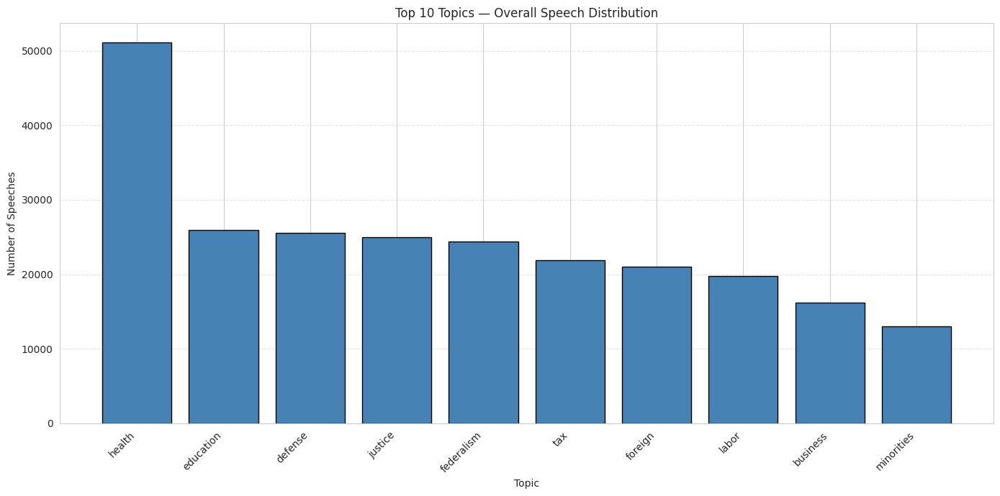


=== TOP 10 TOPICS - OVERALL DISTRIBUTION ===

     topic  Speech_Count   Percent
    health         51142 20.965593
 education         25898 10.616850
   defense         25591 10.490995
   justice         24929 10.219609
federalism         24401 10.003157
       tax         21931  8.990583
   foreign         21025  8.619170
     labor         19791  8.113293
  business         16214  6.646907
minorities         13011  5.333842


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

topic_total = (
    df.groupby('topic')
      .size()
      .reset_index(name='Speech_Count')
      .sort_values('Speech_Count', ascending=False)
)

top10_topics = topic_total.head(10).copy()
top10_topics['Percent'] = top10_topics['Speech_Count'] / top10_topics['Speech_Count'].sum() * 100

plt.figure(figsize=(14,7))
plt.bar(top10_topics['topic'], top10_topics['Speech_Count'], color='steelblue', edgecolor='black')

plt.title("Top 10 Topics — Overall Speech Distribution")
plt.ylabel("Number of Speeches")
plt.xlabel("Topic")
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

print("\n=== TOP 10 TOPICS - OVERALL DISTRIBUTION ===\n")
print(top10_topics.to_string(index=False))


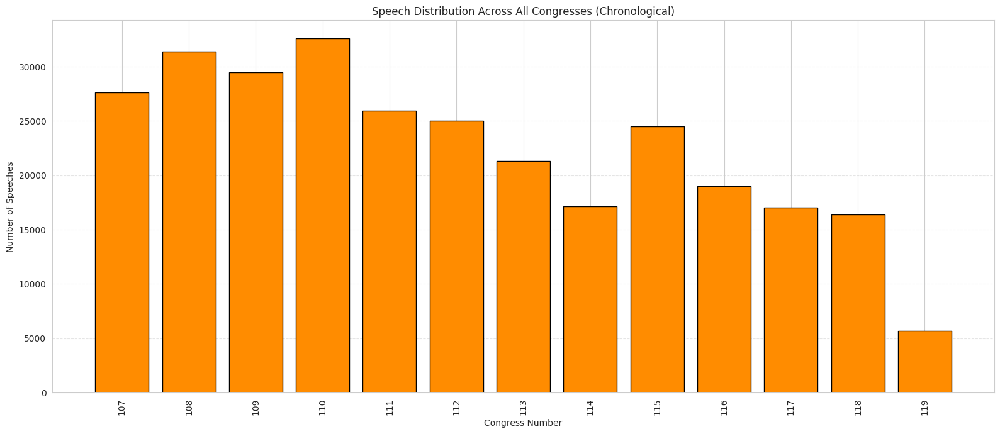


=== ALL CONGRESSES — OVERALL SPEECH DISTRIBUTION ===

 congress  Speech_Count   Percent
      107         27606  9.418853
      108         31396 10.711958
      109         29473 10.055853
      110         32636 11.135032
      111         25950  8.853845
      112         25003  8.530739
      113         21306  7.269365
      114         17146  5.850020
      115         24472  8.349568
      116         19001  6.482925
      117         17047  5.816243
      118         16378  5.587987
      119          5679  1.937610


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df['date'] = pd.to_datetime(df['date'], errors='coerce')
df['year'] = df['date'].dt.year
df['congress'] = ((df['year'] - 1789) // 2) + 1

cong_total = (
    df.groupby('congress')
      .size()
      .reset_index(name='Speech_Count')
      .sort_values('congress')
      .reset_index(drop=True)
)

cong_total['Percent'] = cong_total['Speech_Count'] / cong_total['Speech_Count'].sum() * 100

plt.figure(figsize=(16,7))
plt.bar(cong_total['congress'].astype(str),
        cong_total['Speech_Count'],
        color='darkorange',
        edgecolor='black')

plt.title("Speech Distribution Across All Congresses (Chronological)")
plt.ylabel("Number of Speeches")
plt.xlabel("Congress Number")
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

pd.set_option('display.max_rows', None)
print("\n=== ALL CONGRESSES — OVERALL SPEECH DISTRIBUTION ===\n")
print(cong_total.to_string(index=False))


## Section 2: Aggregated Dynamics of Sentiment and Polarisation (2001–2025)
<a name="section-2-aggregated-dynamics-of-sentiment-and-polarisation-2001-2025"></a>


### 2.1 Sentiment and Polarisation over Time
<a name="section-21-sentiment-and-polaristation-over-time"></a>

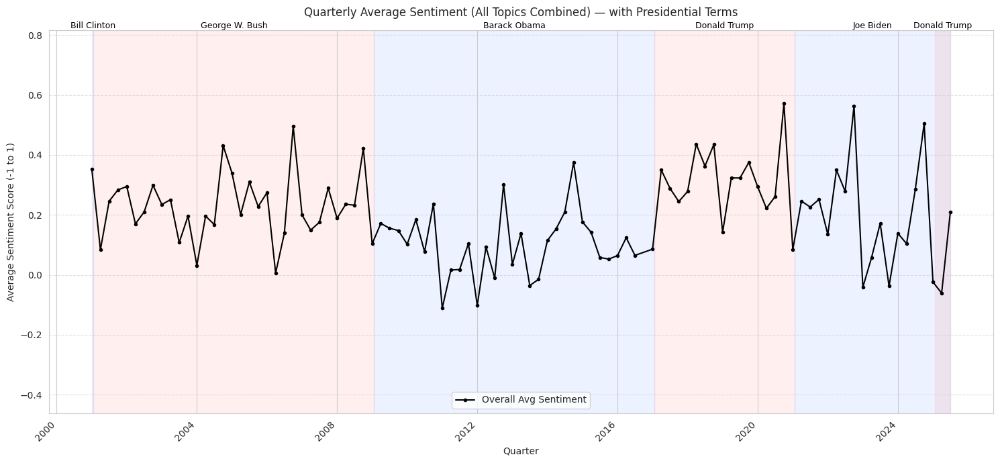

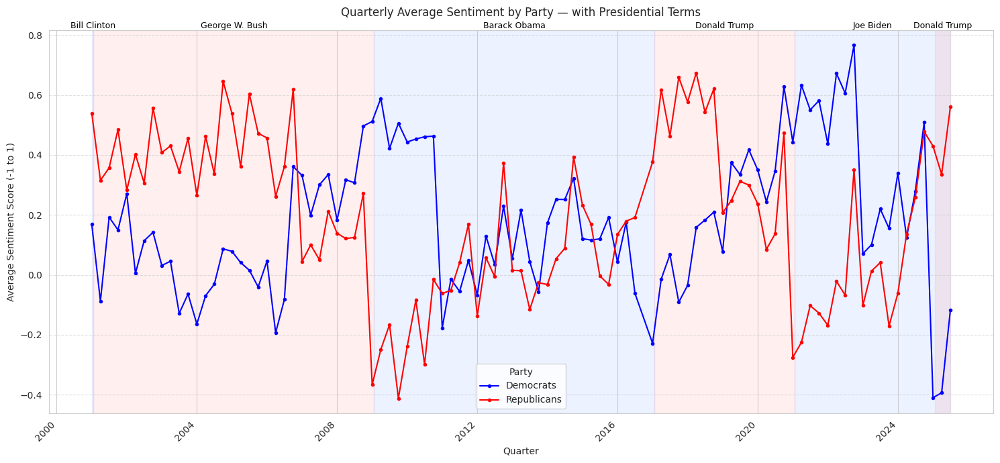

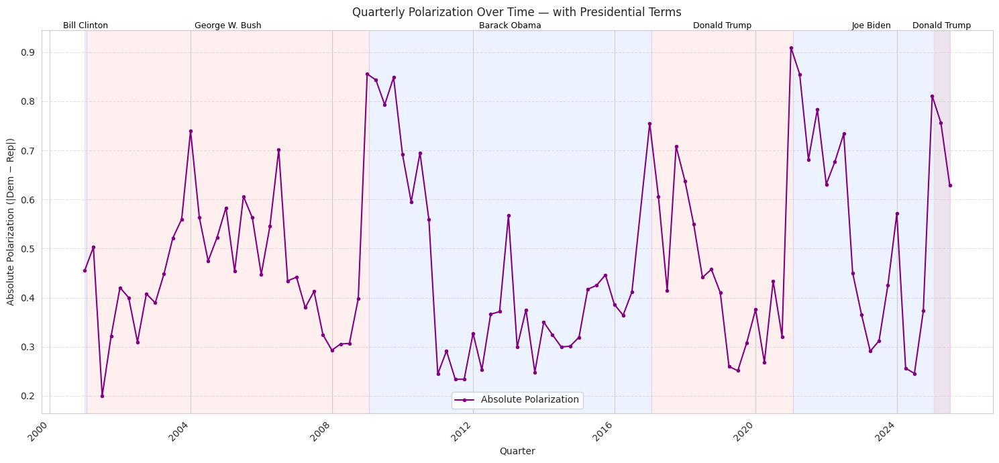

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

plt.rcParams['axes.titlepad'] = 15

def add_presidential_shading(ax, xmin, xmax):
    """Lightly shade U.S. presidential terms (since 2000)."""
    terms = [
        ("Bill Clinton",   "Democratic",  pd.Timestamp("1993-01-20"), pd.Timestamp("2001-01-20")),
        ("George W. Bush", "Republican",  pd.Timestamp("2001-01-20"), pd.Timestamp("2009-01-20")),
        ("Barack Obama",   "Democratic",  pd.Timestamp("2009-01-20"), pd.Timestamp("2017-01-20")),
        ("Donald Trump",   "Republican",  pd.Timestamp("2017-01-20"), pd.Timestamp("2021-01-20")),
        ("Joe Biden",      "Democratic",  pd.Timestamp("2021-01-20"), pd.Timestamp("2100-01-01")),
        ("Donald Trump",   "Republican",  pd.Timestamp("2025-01-20"), pd.Timestamp("2029-01-01")),
    ]
    party_fill = {
        "Democratic": (0.3, 0.5, 1.0, 0.10),
        "Republican": (1.0, 0.4, 0.4, 0.10),
    }
    for name, party, start, end in terms:
        s = max(start, xmin)
        e = min(end,   xmax)
        if s < e:
            ax.axvspan(s, e, color=party_fill[party], zorder=0)
            mid = s + (e - s) / 2
            ax.text(
                mid,
                ax.get_ylim()[1],
                name,
                ha='center',
                va='bottom',
                fontsize=9,
                color='black',
                transform=ax.get_xaxis_transform()
            )

overall_trend = (
    topic_quarter.groupby('quarter')[
        ['Mean_Sentiment_Democratic',
         'Mean_Sentiment_Republican',
         'Avg_Total_Sentiment',
         'Abs_Polarization']
    ]
    .mean()
    .reset_index()
)
overall_trend['date_plot'] = overall_trend['quarter'].apply(lambda x: x.start_time)

min_val = overall_trend[
    ['Mean_Sentiment_Democratic',
     'Mean_Sentiment_Republican',
     'Avg_Total_Sentiment']
].min().min() - 0.05

max_val = overall_trend[
    ['Mean_Sentiment_Democratic',
     'Mean_Sentiment_Republican',
     'Avg_Total_Sentiment']
].max().max() + 0.05

xmin, xmax = overall_trend['date_plot'].min(), overall_trend['date_plot'].max()

plt.figure(figsize=(15, 7))
ax1 = plt.gca()
add_presidential_shading(ax1, xmin, xmax)

plt.plot(
    overall_trend['date_plot'],
    overall_trend['Avg_Total_Sentiment'],
    linestyle='-',
    marker='o',
    markersize=3,
    color='black',
    label='Overall Avg Sentiment'
)

plt.title("Quarterly Average Sentiment (All Topics Combined) — with Presidential Terms")
plt.xlabel("Quarter")
plt.ylabel("Average Sentiment Score (-1 to 1)")
plt.legend()
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.xticks(rotation=45, ha='right')
plt.ylim(min_val, max_val)
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 7))
ax2 = plt.gca()
add_presidential_shading(ax2, xmin, xmax)

plt.plot(
    overall_trend['date_plot'],
    overall_trend['Mean_Sentiment_Democratic'],
    linestyle='-',
    marker='o',
    markersize=3,
    color='blue',
    label='Democrats'
)
plt.plot(
    overall_trend['date_plot'],
    overall_trend['Mean_Sentiment_Republican'],
    linestyle='-',
    marker='o',
    markersize=3,
    color='red',
    label='Republicans'
)

plt.title("Quarterly Average Sentiment by Party — with Presidential Terms")
plt.xlabel("Quarter")
plt.ylabel("Average Sentiment Score (-1 to 1)")
plt.legend(title='Party')
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.xticks(rotation=45, ha='right')
plt.ylim(min_val, max_val)
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 7))
ax3 = plt.gca()
add_presidential_shading(ax3, xmin, xmax)

plt.plot(
    overall_trend['date_plot'],
    overall_trend['Abs_Polarization'],
    linestyle='-',
    marker='o',
    markersize=3,
    color='purple',
    label='Absolute Polarization'
)

plt.title("Quarterly Polarization Over Time — with Presidential Terms")
plt.xlabel("Quarter")
plt.ylabel("Absolute Polarization (|Dem − Rep|)")
plt.legend()
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

score_table = overall_trend[['quarter',
                             'Mean_Sentiment_Democratic',
                             'Mean_Sentiment_Republican',
                             'Avg_Total_Sentiment',
                             'Abs_Polarization']].copy()

#Quarter-over-Quarter (% change)
score_table['Democratic_QoQ_%']   = score_table['Mean_Sentiment_Democratic'].pct_change(periods=1) * 100
score_table['Republican_QoQ_%']   = score_table['Mean_Sentiment_Republican'].pct_change(periods=1) * 100
score_table['Overall_QoQ_%']      = score_table['Avg_Total_Sentiment'].pct_change(periods=1) * 100
score_table['Polarization_QoQ_%'] = score_table['Abs_Polarization'].pct_change(periods=1) * 100

#Year-over-Year (% change)
score_table['Democratic_YoY_%']   = score_table['Mean_Sentiment_Democratic'].pct_change(periods=4) * 100
score_table['Republican_YoY_%']   = score_table['Mean_Sentiment_Republican'].pct_change(periods=4) * 100
score_table['Overall_YoY_%']      = score_table['Avg_Total_Sentiment'].pct_change(periods=4) * 100
score_table['Polarization_YoY_%'] = score_table['Abs_Polarization'].pct_change(periods=4) * 100


score_table = score_table.sort_values('quarter').reset_index(drop=True)
score_table['quarter'] = score_table['quarter'].astype(str)  # nicer printing


pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', '{:.3f}'.format)

print("\n=== QUARTERLY SENTIMENT & POLARIZATION (LEVELS + QoQ & YoY %) ===\n")
print(score_table.to_string(index=False))



=== QUARTERLY SENTIMENT & POLARIZATION (LEVELS + QoQ & YoY %) ===

quarter  Mean_Sentiment_Democratic  Mean_Sentiment_Republican  Avg_Total_Sentiment  Abs_Polarization  Democratic_QoQ_%  Republican_QoQ_%  Overall_QoQ_%  Polarization_QoQ_%  Democratic_YoY_%  Republican_YoY_%  Overall_YoY_%  Polarization_YoY_%
 2001Q1                      0.168                      0.539                0.354             0.455               NaN               NaN            NaN                 NaN               NaN               NaN            NaN                 NaN
 2001Q2                     -0.088                      0.315                0.084             0.503          -152.536           -41.519        -76.382              10.391               NaN               NaN            NaN                 NaN
 2001Q3                      0.192                      0.357                0.246             0.200          -317.549            13.299        194.265             -60.209               NaN              

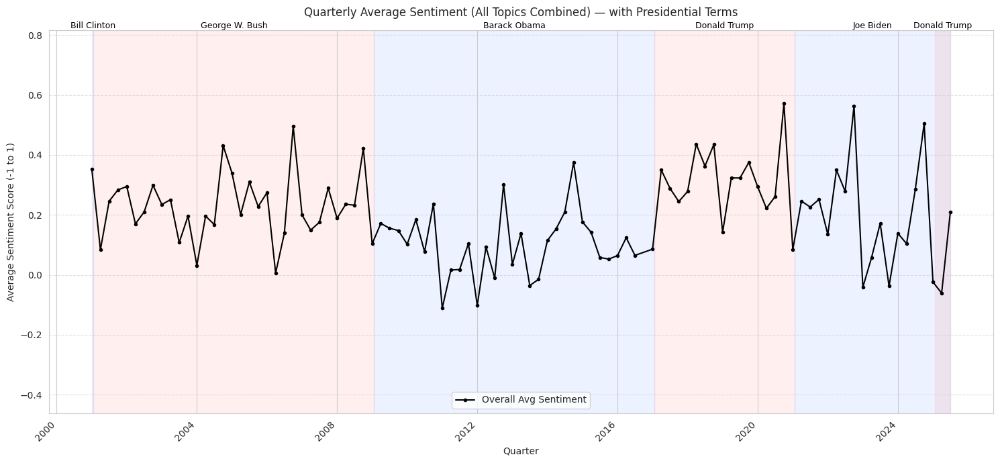

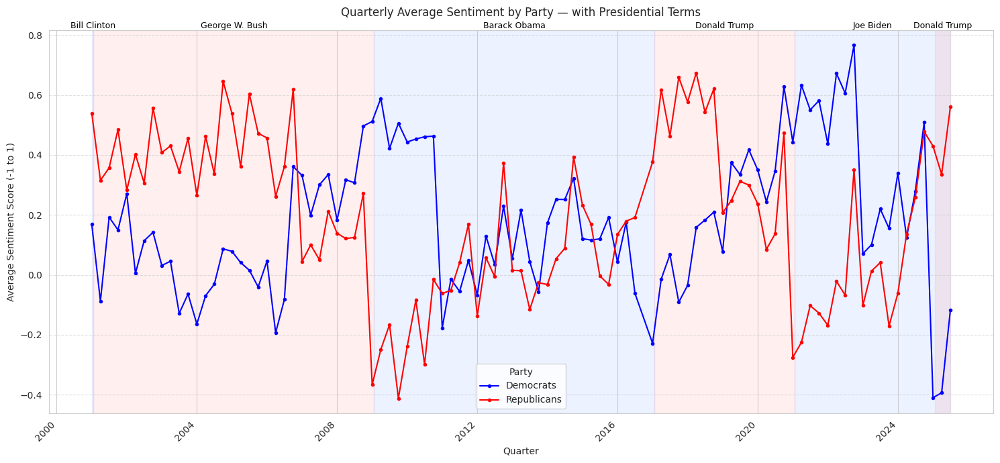

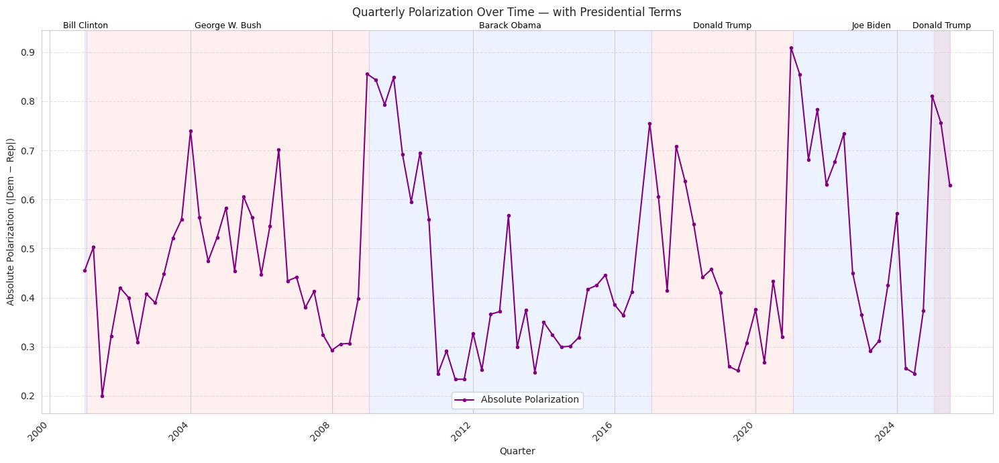

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def add_presidential_shading(ax, xmin, xmax):
    """Lightly shade U.S. presidential terms (since 2000)."""
    terms = [
        ("Bill Clinton",   "Democratic",  pd.Timestamp("1993-01-20"), pd.Timestamp("2001-01-20")),
        ("George W. Bush", "Republican",  pd.Timestamp("2001-01-20"), pd.Timestamp("2009-01-20")),
        ("Barack Obama",   "Democratic",  pd.Timestamp("2009-01-20"), pd.Timestamp("2017-01-20")),
        ("Donald Trump",   "Republican",  pd.Timestamp("2017-01-20"), pd.Timestamp("2021-01-20")),
        ("Joe Biden",      "Democratic",  pd.Timestamp("2021-01-20"), pd.Timestamp("2100-01-01")),
        ("Donald Trump",   "Republican",  pd.Timestamp("2025-01-20"), pd.Timestamp("2029-01-01")),
    ]
    party_fill = {
        "Democratic": (0.3, 0.5, 1.0, 0.10),
        "Republican": (1.0, 0.4, 0.4, 0.10),
    }
    for name, party, start, end in terms:
        s = max(start, xmin)
        e = min(end,   xmax)
        if s < e:
            ax.axvspan(s, e, color=party_fill[party], zorder=0)
            mid = s + (e - s) / 2
            ax.text(mid, ax.get_ylim()[1],
                    name, ha='center', va='bottom', fontsize=9, color='black',
                    transform=ax.get_xaxis_transform())


overall_trend = (
    topic_quarter.groupby('quarter')[['Mean_Sentiment_Democratic', 'Mean_Sentiment_Republican', 'Avg_Total_Sentiment', 'Abs_Polarization']]
    .mean()
    .reset_index()
)
overall_trend['date_plot'] = overall_trend['quarter'].apply(lambda x: x.start_time)


min_val = overall_trend[['Mean_Sentiment_Democratic', 'Mean_Sentiment_Republican', 'Avg_Total_Sentiment']].min().min() - 0.05
max_val = overall_trend[['Mean_Sentiment_Democratic', 'Mean_Sentiment_Republican', 'Avg_Total_Sentiment']].max().max() + 0.05
xmin, xmax = overall_trend['date_plot'].min(), overall_trend['date_plot'].max()

#Plot 1: Overall Average Sentiment
plt.figure(figsize=(15, 7))
ax1 = plt.gca()
add_presidential_shading(ax1, xmin, xmax)

plt.plot(overall_trend['date_plot'], overall_trend['Avg_Total_Sentiment'],
         linestyle='-', marker='o', markersize=3, color='black', label='Overall Avg Sentiment')

plt.title("Quarterly Average Sentiment (All Topics Combined) — with Presidential Terms")
plt.xlabel("Quarter")
plt.ylabel("Average Sentiment Score (-1 to 1)")
plt.legend()
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.xticks(rotation=45, ha='right')
plt.ylim(min_val, max_val)
plt.tight_layout()
plt.show()

#Plot 2: Party Sentiment Comparison
plt.figure(figsize=(15, 7))
ax2 = plt.gca()
add_presidential_shading(ax2, xmin, xmax)

plt.plot(overall_trend['date_plot'], overall_trend['Mean_Sentiment_Democratic'],
         linestyle='-', marker='o', markersize=3, color='blue', label='Democrats')
plt.plot(overall_trend['date_plot'], overall_trend['Mean_Sentiment_Republican'],
         linestyle='-', marker='o', markersize=3, color='red', label='Republicans')

plt.title("Quarterly Average Sentiment by Party — with Presidential Terms")
plt.xlabel("Quarter")
plt.ylabel("Average Sentiment Score (-1 to 1)")
plt.legend(title='Party')
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.xticks(rotation=45, ha='right')
plt.ylim(min_val, max_val)
plt.tight_layout()
plt.show()

#Plot 3: Absolute Polarization (|Dem − Rep|)
plt.figure(figsize=(15, 7))
ax3 = plt.gca()
add_presidential_shading(ax3, xmin, xmax)

plt.plot(overall_trend['date_plot'], overall_trend['Abs_Polarization'],
         linestyle='-', marker='o', markersize=3, color='purple', label='Absolute Polarization')

plt.title("Quarterly Polarization Over Time — with Presidential Terms")
plt.xlabel("Quarter")
plt.ylabel("Absolute Polarization (|Dem − Rep|)")
plt.legend()
plt.grid(True, axis='y', linestyle='--', alpha=0.6)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### 2.2 Topic-Level Dynamics and Polarisation
<a name="section-22-topic-level-dynamics-and-polarisation"></a>

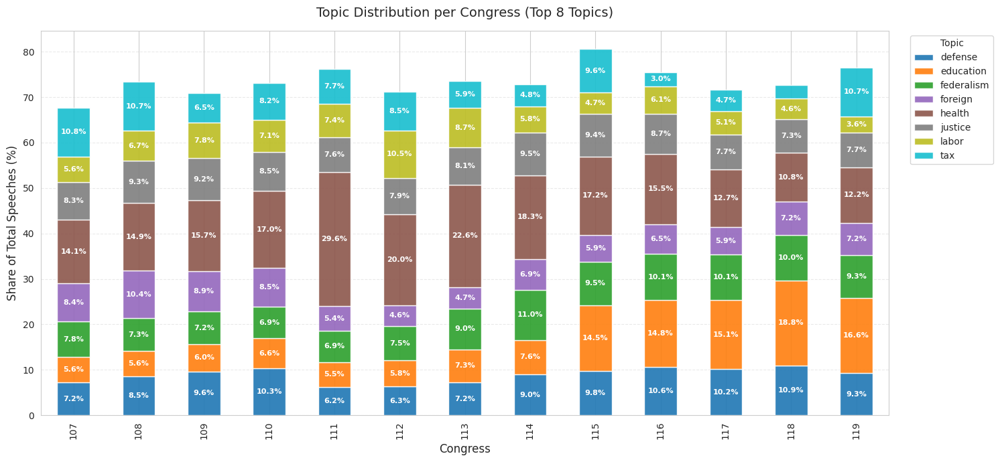

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df['date'] = pd.to_datetime(df['date'], errors='coerce')
df['year'] = df['date'].dt.year
df['congress'] = ((df['year'] - 1789) // 2) + 1

topic_congress = (
    df.groupby(['congress', 'topic'])
    .size()
    .reset_index(name='Speech_Count')
)
topic_congress['Share_Percent'] = topic_congress.groupby('congress')['Speech_Count'].transform(lambda x: 100 * x / x.sum())

TOP_N = 8
top_topics = (
    topic_congress.groupby('topic')['Speech_Count']
    .sum()
    .nlargest(TOP_N)
    .index
)
topic_topN = topic_congress[topic_congress['topic'].isin(top_topics)]

topic_pivot = topic_topN.pivot(index='congress', columns='topic', values='Share_Percent').fillna(0)

fig, ax = plt.subplots(figsize=(15, 7))
topic_pivot.plot(kind='bar', stacked=True, cmap='tab10', ax=ax, alpha=0.9, edgecolor='white')

for i, (idx, row) in enumerate(topic_pivot.iterrows()):
    cumulative = 0
    for topic in topic_pivot.columns:
        val = row[topic]
        if val > 3:
            ax.text(
                i, cumulative + val / 2,
                f"{val:.1f}%", ha='center', va='center', fontsize=8, color='white', weight='bold'
            )
        cumulative += val


ax.set_title(f"Topic Distribution per Congress (Top {TOP_N} Topics)", fontsize=14, pad=15)
ax.set_xlabel("Congress", fontsize=12)
ax.set_ylabel("Share of Total Speeches (%)", fontsize=12)
ax.legend(title="Topic", bbox_to_anchor=(1.02, 1), loc='upper left')
ax.grid(True, axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

polarization_ranking = (
    topic_quarter.groupby('topic')
    .agg(
        Avg_Polarization=('Abs_Polarization', 'mean'),
        Max_Polarization=('Abs_Polarization', 'max'),
        Min_Polarization=('Abs_Polarization', 'min'),
        Std_Polarization=('Abs_Polarization', 'std'),
        N_Quarters=('Abs_Polarization', 'count')
    )
    .reset_index()
)

speech_counts = df.groupby('topic').size().reset_index(name='Total_Speeches')

polarization_ranking = polarization_ranking.merge(speech_counts, on='topic', how='left')

polarization_ranking = polarization_ranking.sort_values('Avg_Polarization', ascending=False).reset_index(drop=True)

pd.set_option('display.max_rows', 20)
pd.set_option('display.float_format', '{:.3f}'.format)

print("\n=== MOST POLARIZING TOPICS (Average Absolute Sentiment Difference + Speech Counts) ===\n")
print(polarization_ranking[['topic', 'Avg_Polarization', 'Max_Polarization', 'Min_Polarization',
                            'Std_Polarization', 'N_Quarters', 'Total_Speeches']].head(22).to_string(index=False))




=== MOST POLARIZING TOPICS (Average Absolute Sentiment Difference + Speech Counts) ===

      topic  Avg_Polarization  Max_Polarization  Min_Polarization  Std_Polarization  N_Quarters  Total_Speeches
    alcohol             1.000             2.000             0.000             1.095           6              46
    economy             0.736             2.000             0.000             0.574          90            1177
       mail             0.696             2.000             0.000             0.698          42             421
        tax             0.660             1.722             0.003             0.406          98           21931
environment             0.622             2.000             0.000             0.559          87            1125
  elections             0.617             1.833             0.015             0.407          98            4123
      crime             0.536             1.410             0.000             0.365          98            6521
immigration    

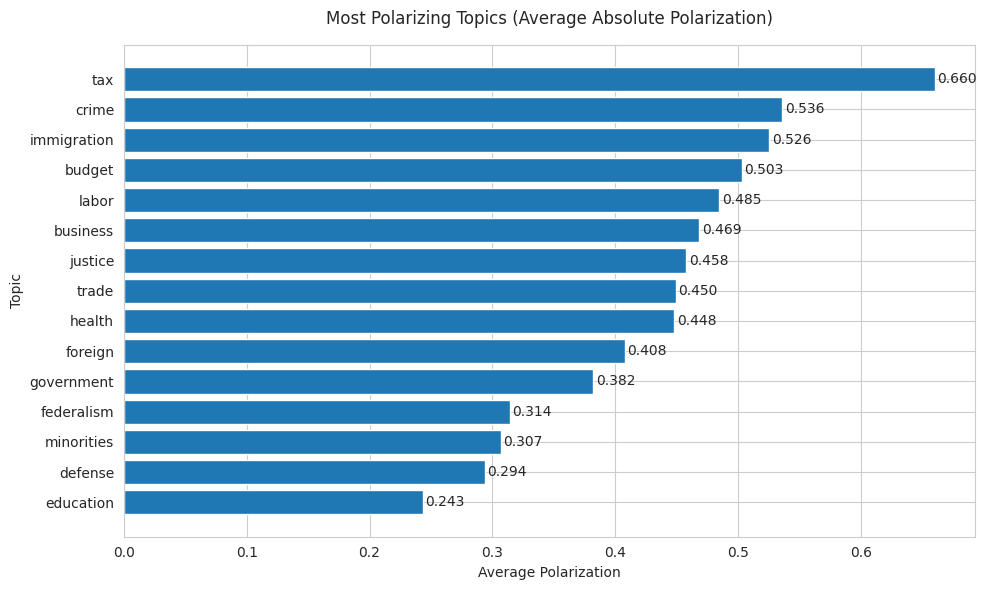

In [ ]:
import matplotlib.pyplot as plt

# Exclude specific topics
filtered_ranking = polarization_ranking[
    ~polarization_ranking['topic'].isin(['alcohol', 'economy', 'religion', 'money',  'mail', 'environment',  'elections', ])
]

# Select top 22 most polarizing topics
top_topics = filtered_ranking.head(22)

plt.figure(figsize=(10, 6))
bars = plt.barh(top_topics['topic'], top_topics['Avg_Polarization'])

plt.xlabel('Average Polarization')
plt.ylabel('Topic')
plt.title('Most Polarizing Topics (Average Absolute Polarization)')
plt.gca().invert_yaxis()  # Highest value on top

# Add value labels at the end of each bar
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 0.002,
        bar.get_y() + bar.get_height() / 2,
        f'{width:.3f}',
        va='center'
    )

plt.tight_layout()
plt.show()

In [ ]:
speech_counts

,topic,Total_Speeches
0,alcohol,46
1,budget,11334
2,business,16214
3,crime,6521
4,defense,25591
5,economy,1177
6,education,25898
7,elections,4123
8,environment,1125
9,federalism,24401



=== BUDGET ===


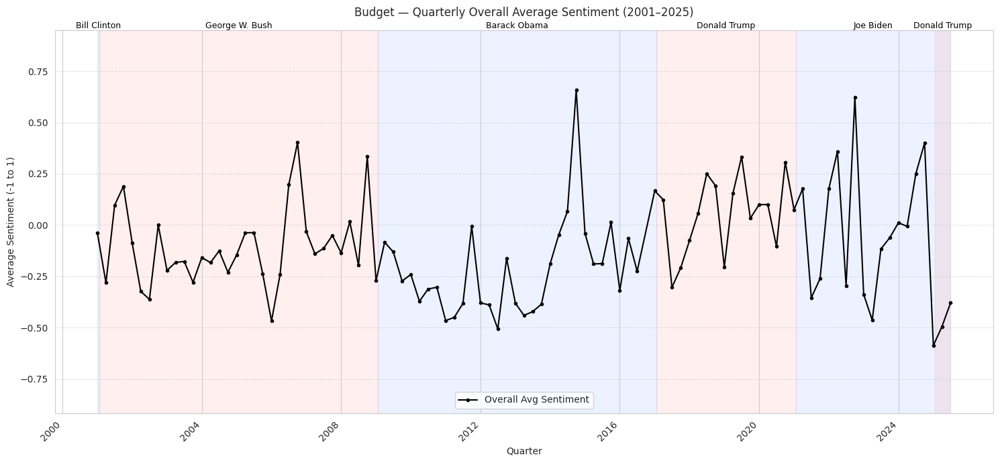

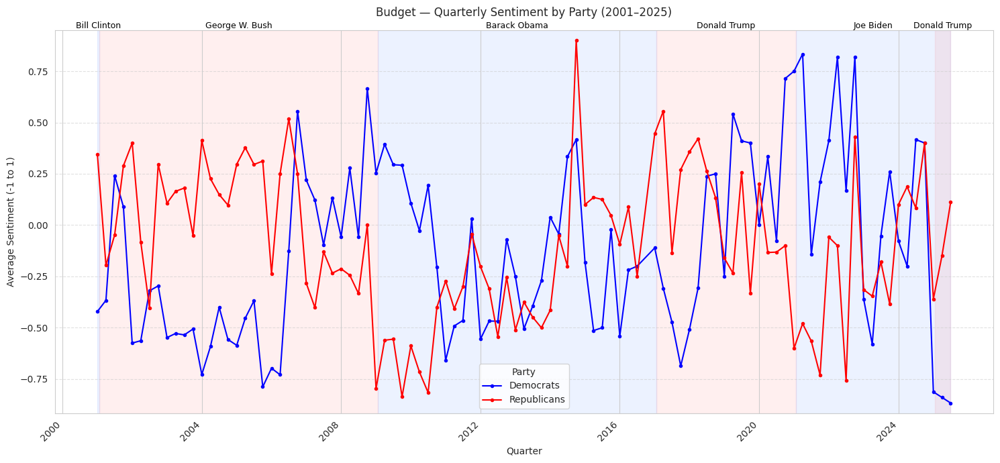

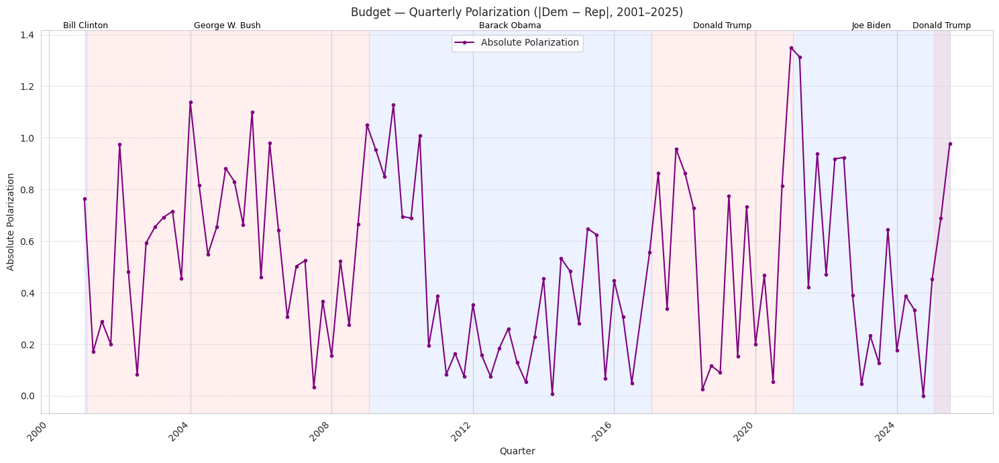


=== LABOR ===


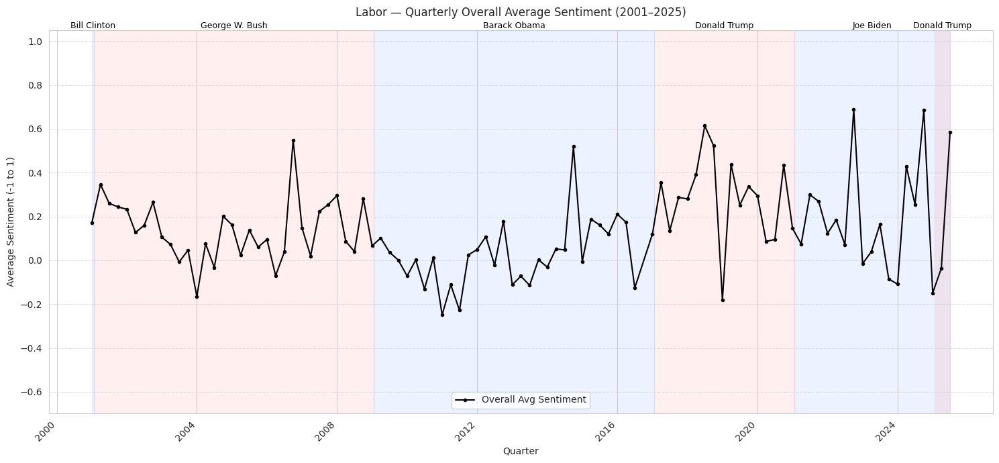

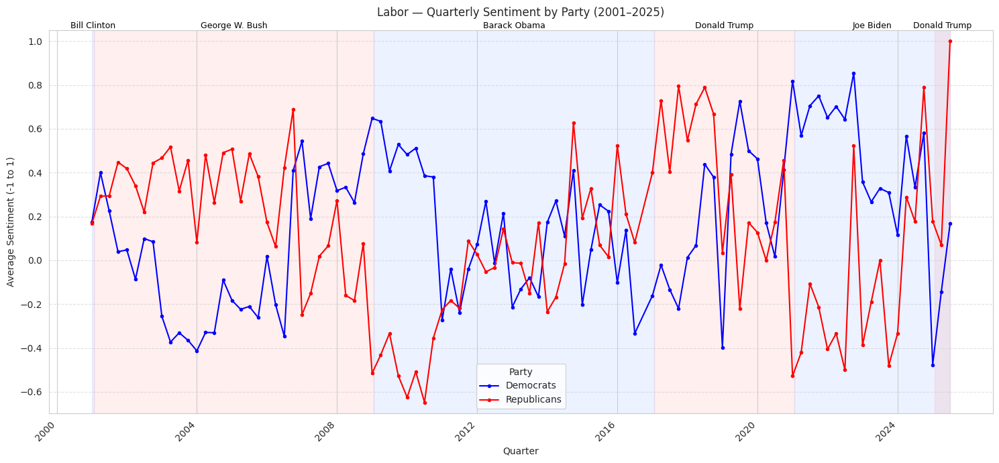

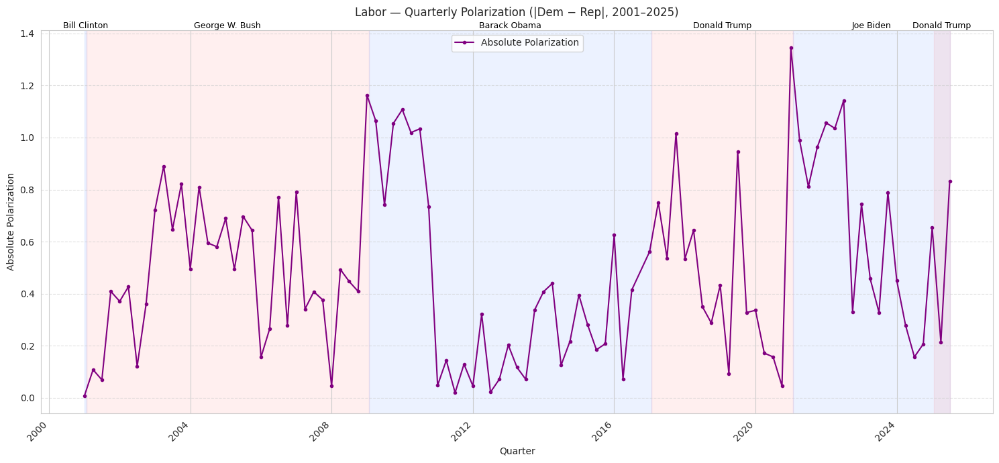


=== BUSINESS ===


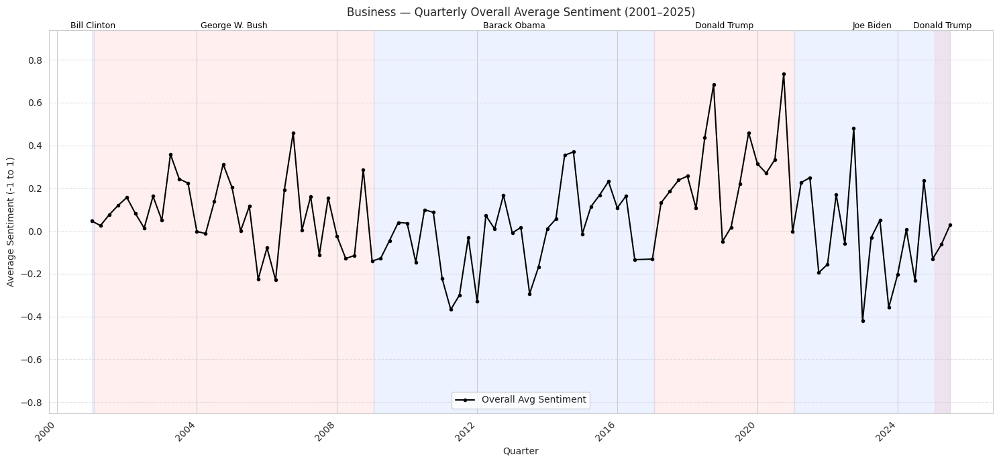

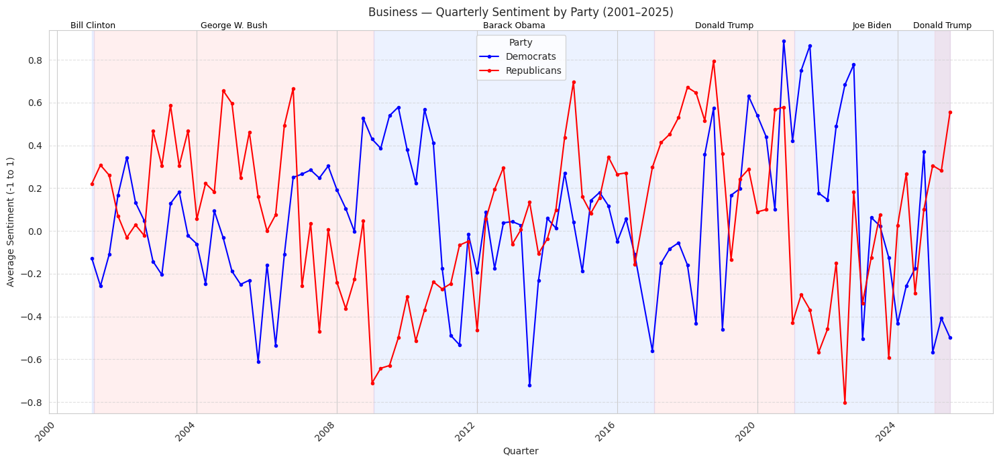

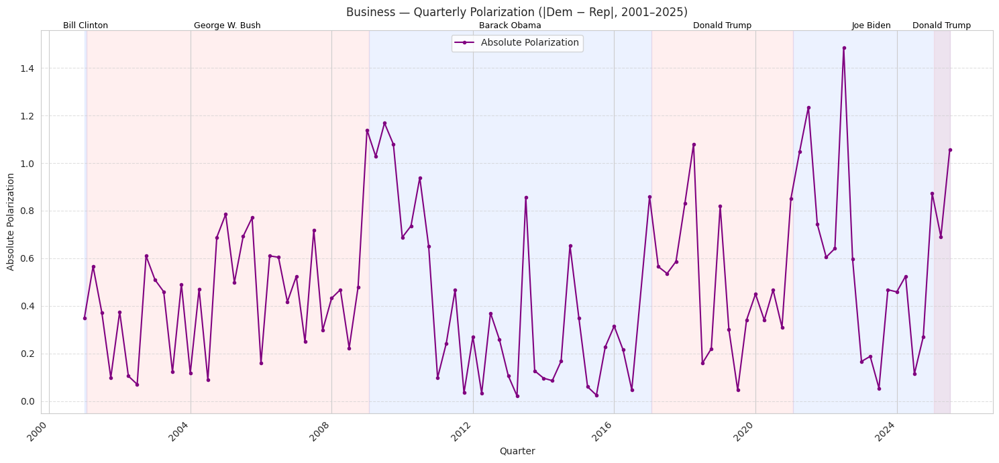


=== JUSTICE ===


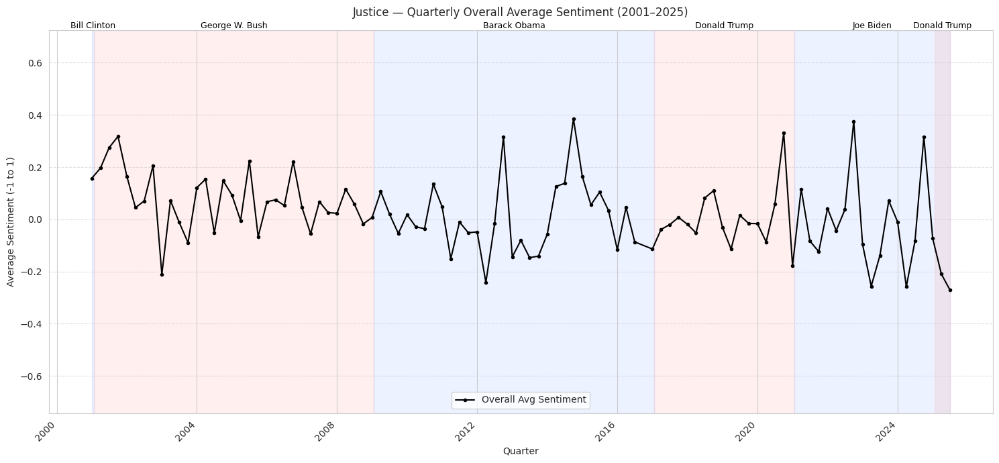

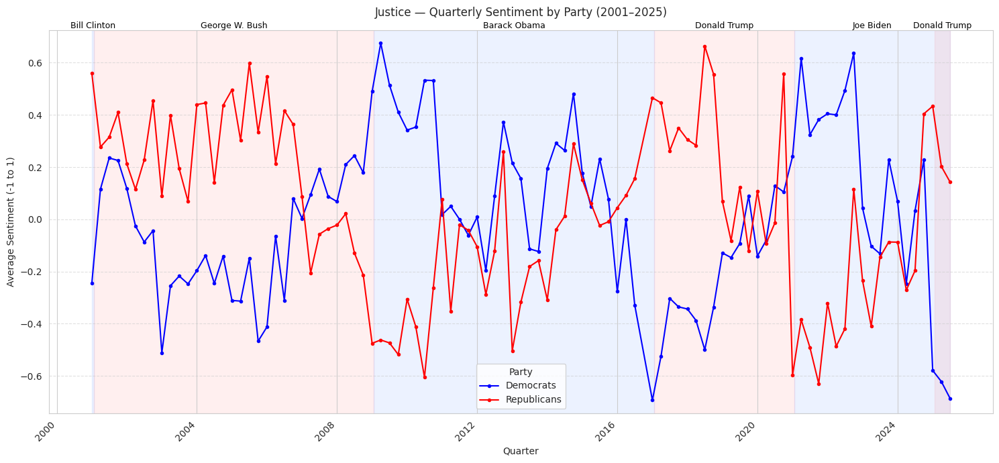

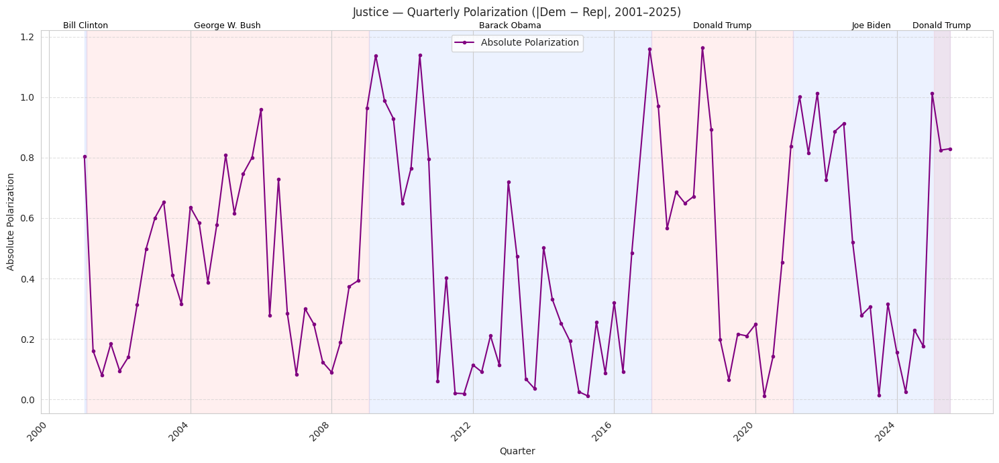


=== HEALTH ===


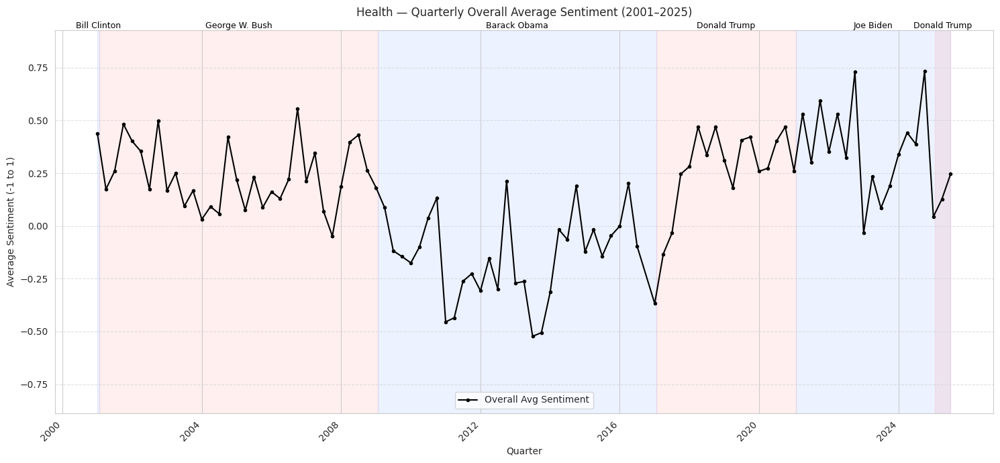

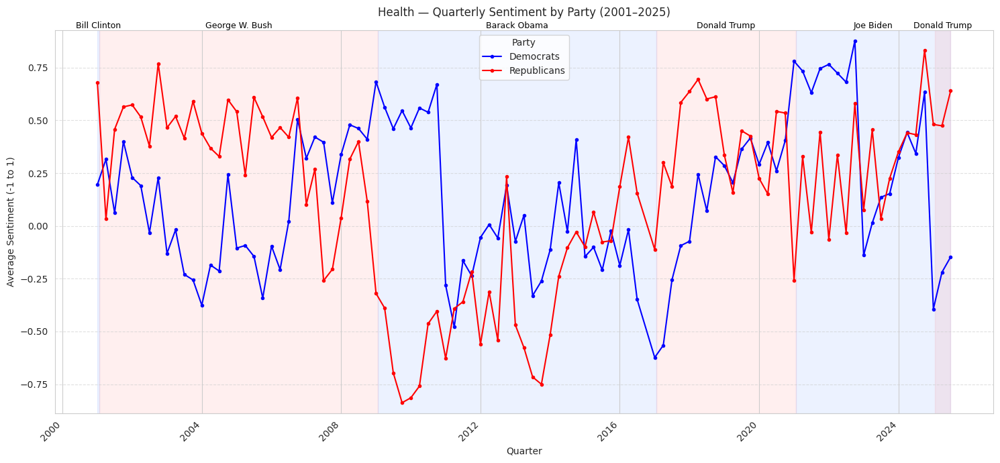

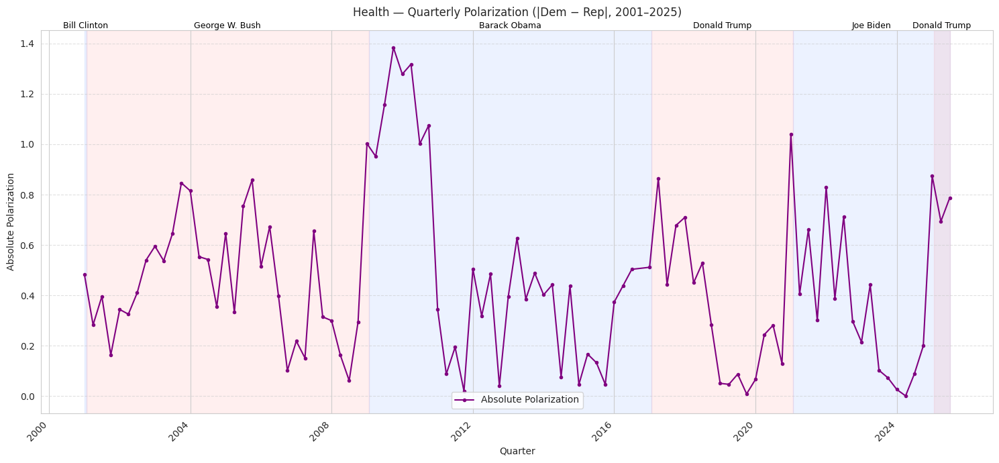


=== FOREIGN ===


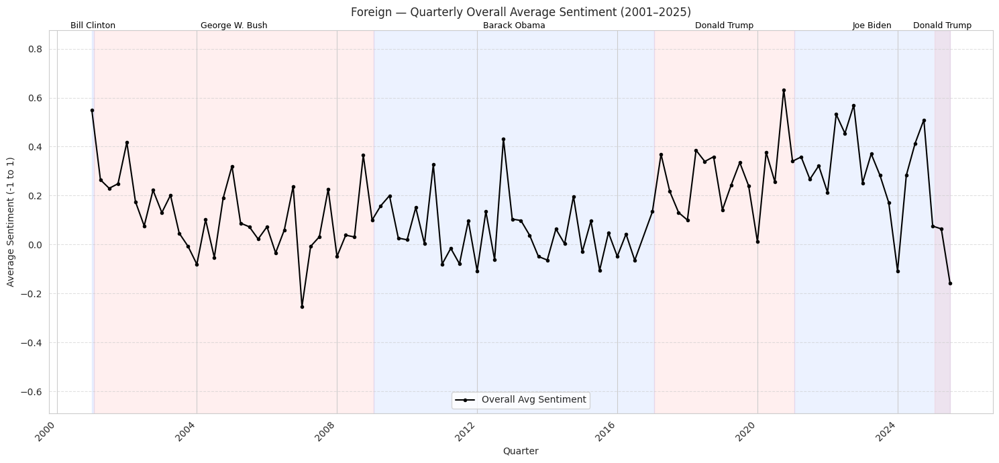

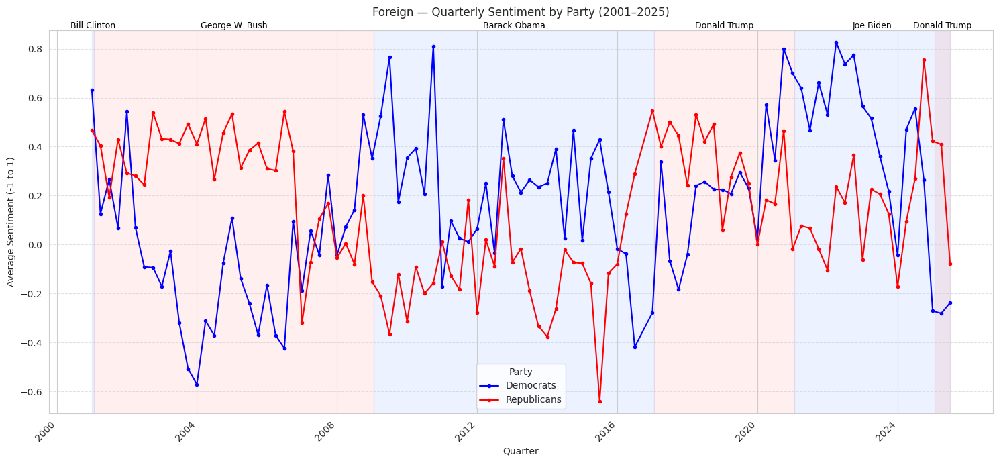

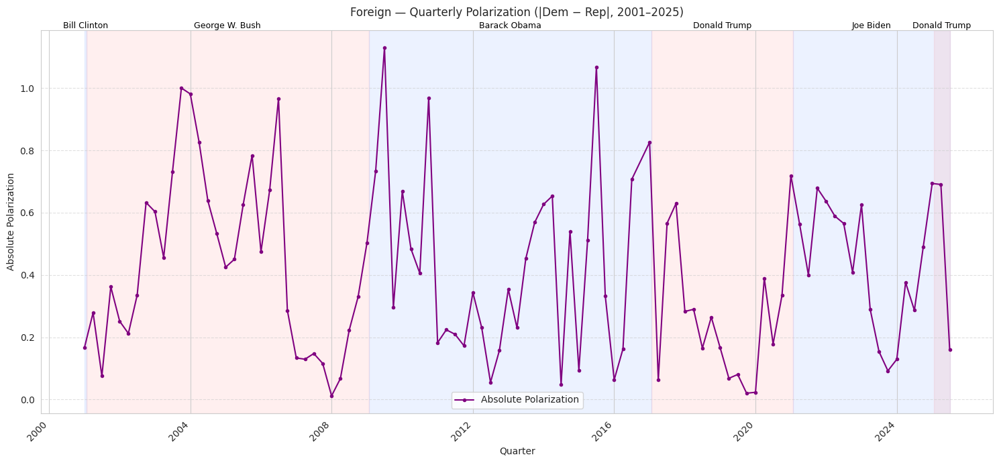


=== TAX ===


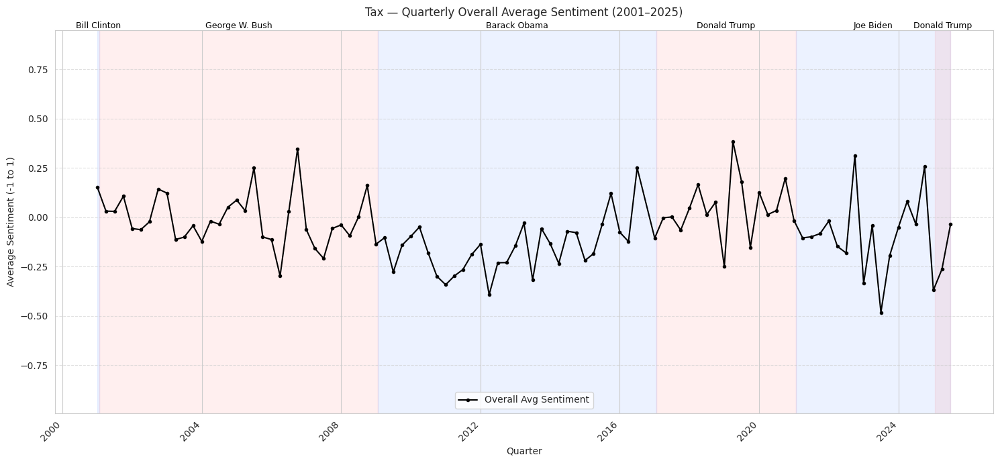

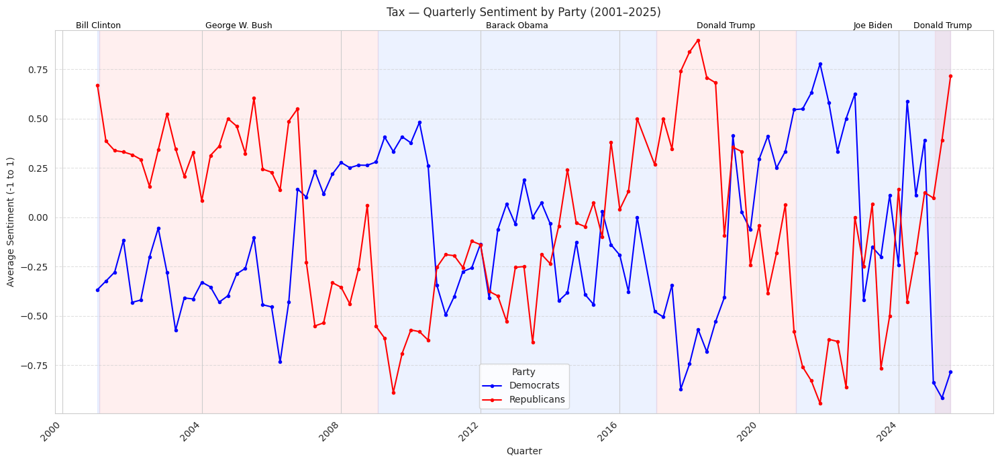

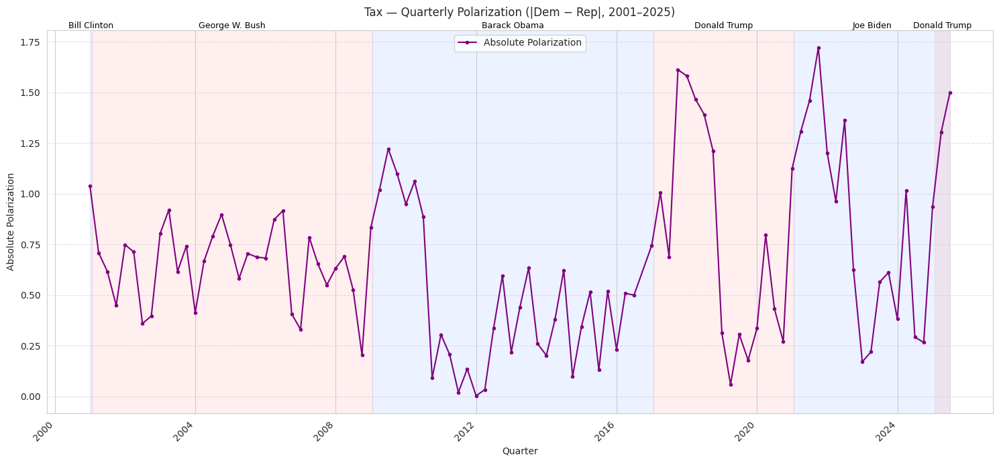


=== FEDERALISM ===


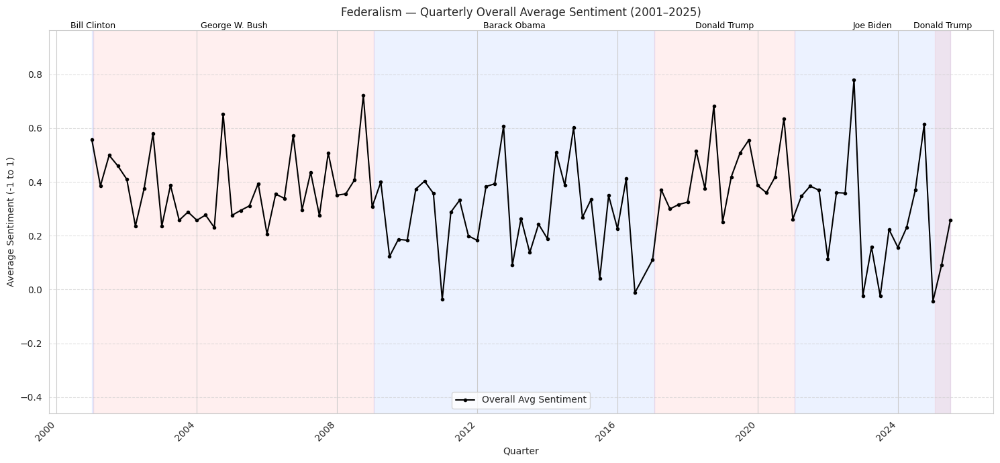

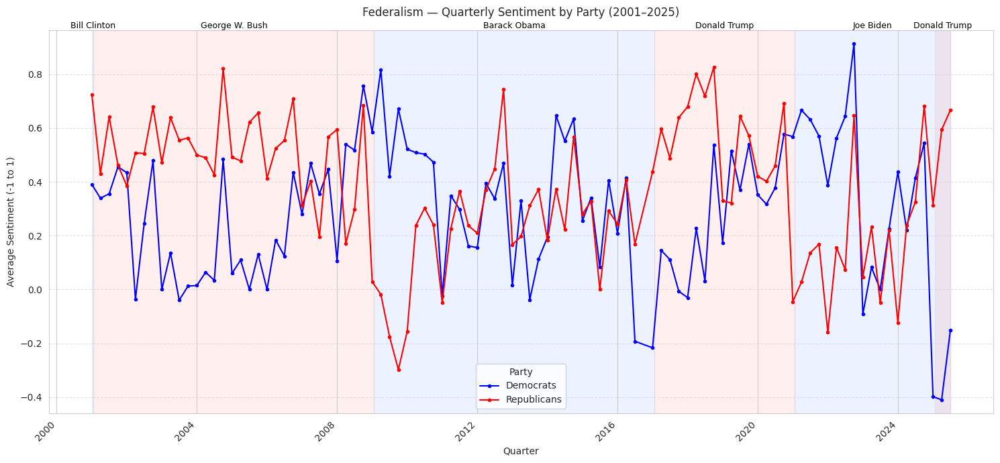

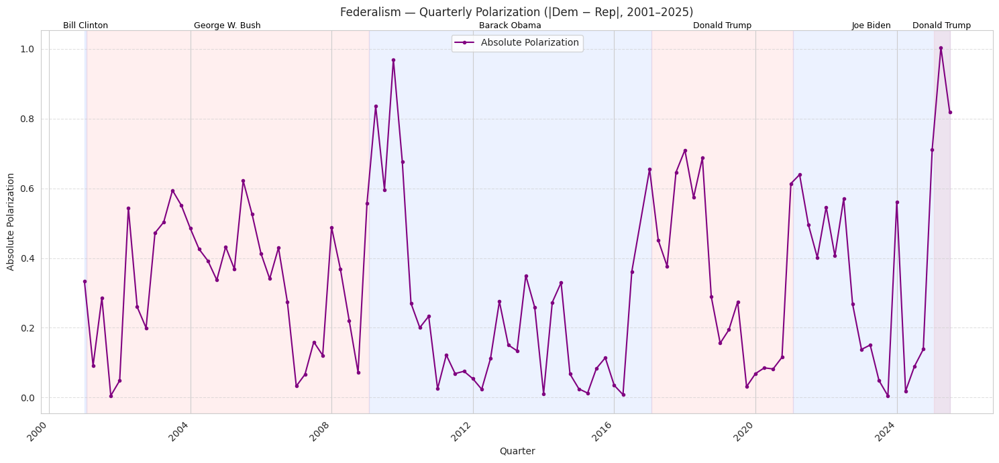


=== MINORITIES ===


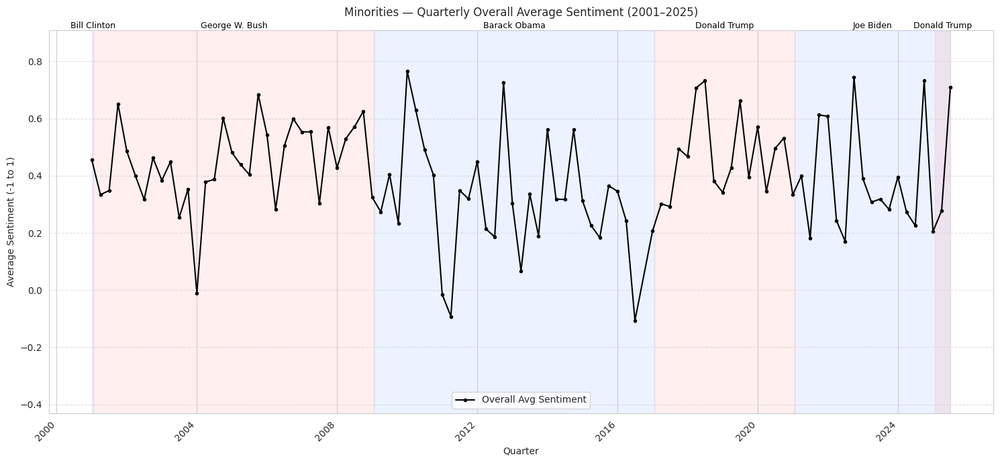

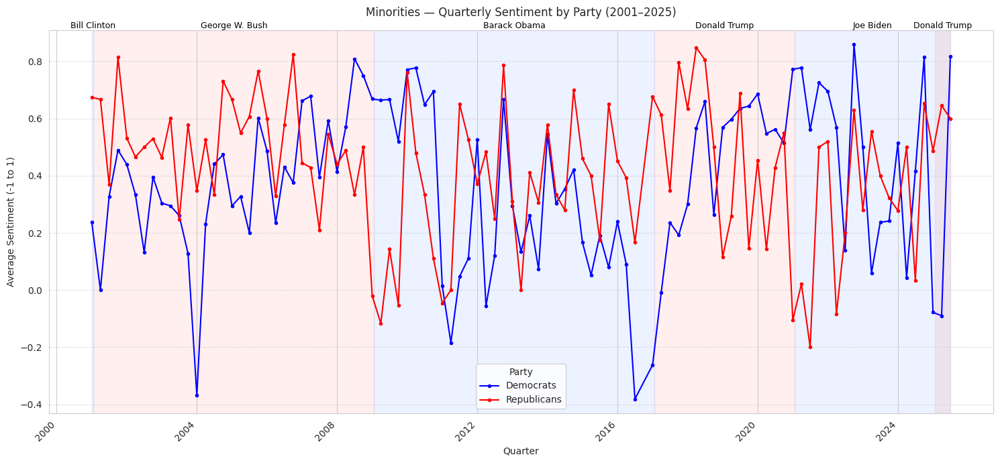

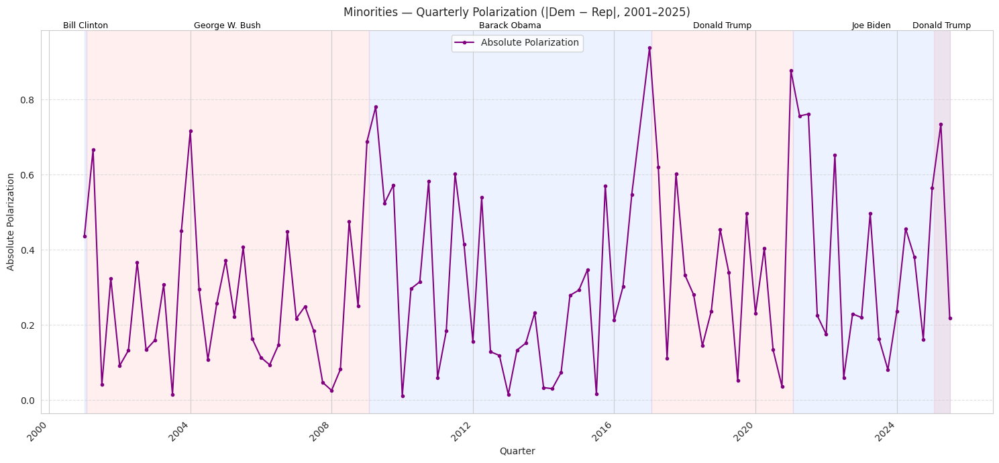


=== DEFENSE ===


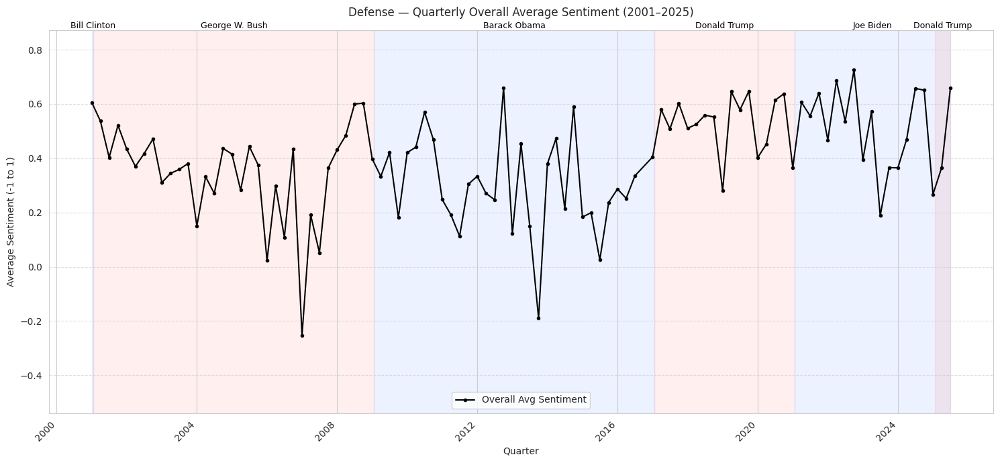

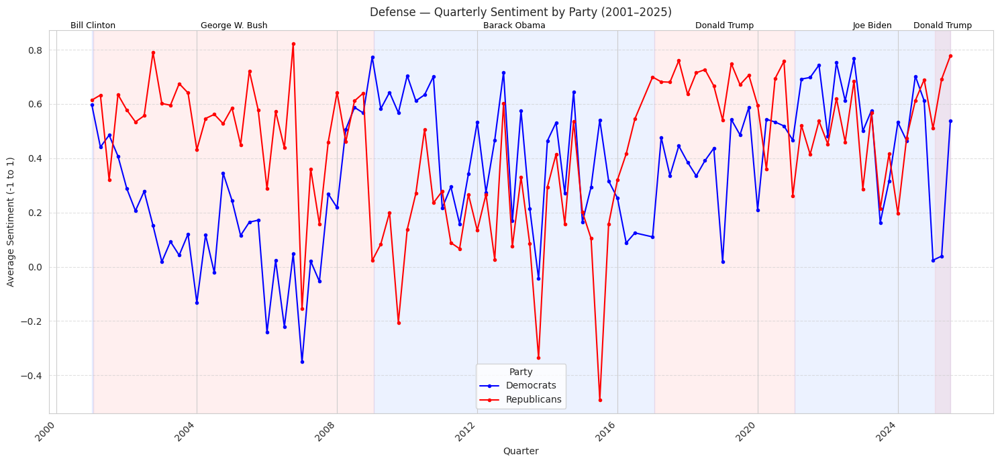

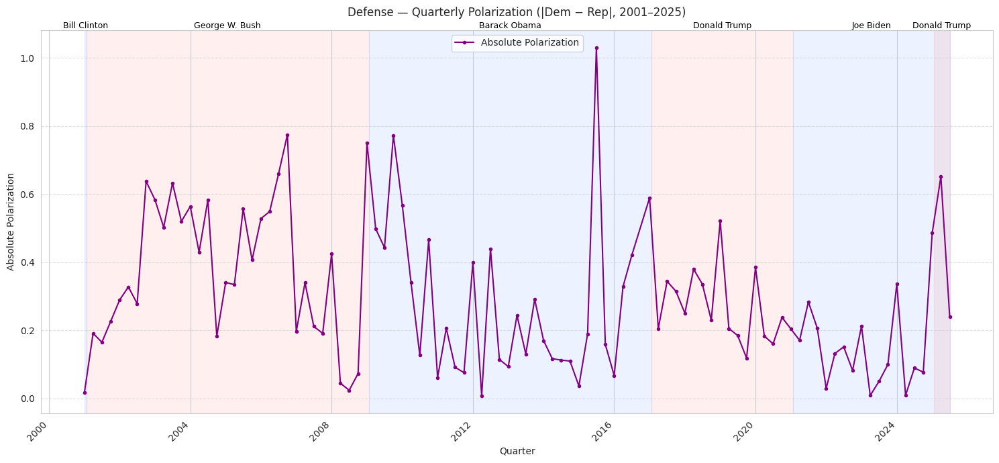


=== EDUCATION ===


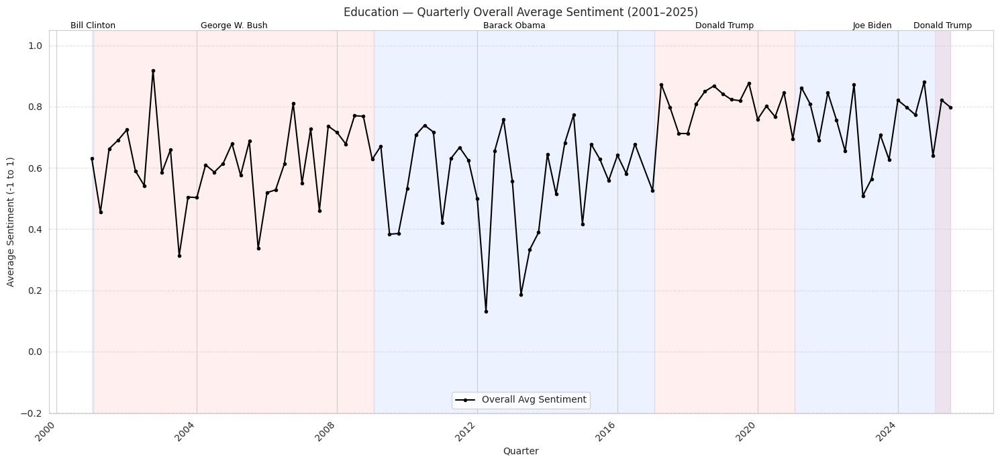

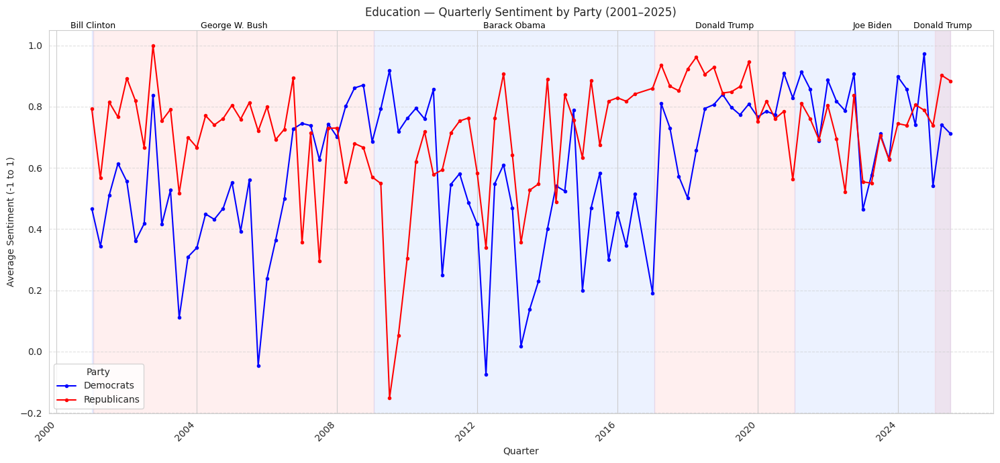

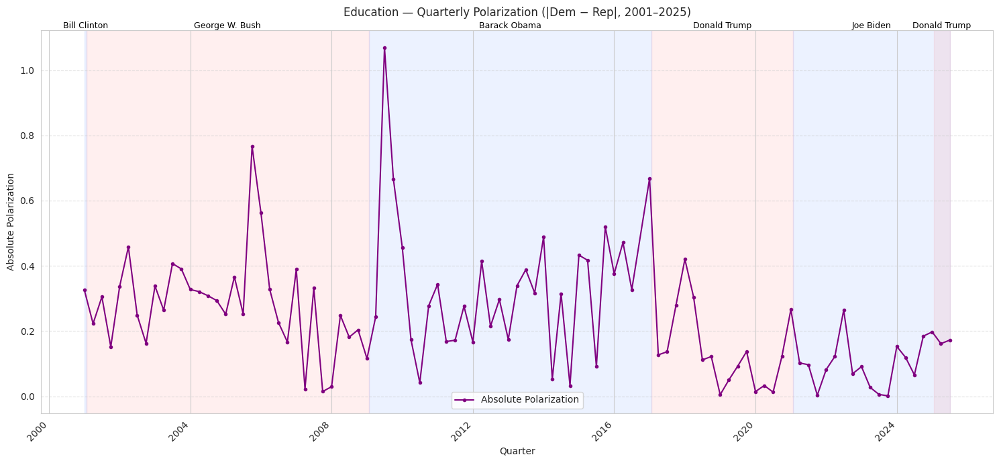

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def add_presidential_shading(ax, xmin, xmax):
    """Lightly shade U.S. presidential terms (since 2000)."""
    terms = [
        ("Bill Clinton",   "Democratic",  pd.Timestamp("1993-01-20"), pd.Timestamp("2001-01-20")),
        ("George W. Bush", "Republican",  pd.Timestamp("2001-01-20"), pd.Timestamp("2009-01-20")),
        ("Barack Obama",   "Democratic",  pd.Timestamp("2009-01-20"), pd.Timestamp("2017-01-20")),
        ("Donald Trump",   "Republican",  pd.Timestamp("2017-01-20"), pd.Timestamp("2021-01-20")),
        ("Joe Biden",      "Democratic",  pd.Timestamp("2021-01-20"), pd.Timestamp("2100-01-01")),
        ("Donald Trump",   "Republican",  pd.Timestamp("2025-01-20"), pd.Timestamp("2029-01-01")),
    ]
    party_fill = {
        "Democratic": (0.3, 0.5, 1.0, 0.10),
        "Republican": (1.0, 0.4, 0.4, 0.10),
    }
    for name, party, start, end in terms:
        s = max(start, xmin)
        e = min(end, xmax)
        if s < e:
            ax.axvspan(s, e, color=party_fill[party], zorder=0)
            mid = s + (e - s) / 2
            ax.text(mid, ax.get_ylim()[1],
                    name, ha='center', va='bottom', fontsize=9, color='black',
                    transform=ax.get_xaxis_transform())

TARGET_TOPICS = ['budget', 'labor', 'business', 'justice', 'health',
                 'foreign', 'tax', 'federalism', 'minorities', 'defense', 'education']

for topic in TARGET_TOPICS:
    df_t = topic_quarter[topic_quarter['topic'] == topic].copy()
    if df_t.empty:
        print(f"⚠️ Topic '{topic}' not found in data — skipping.\n")
        continue

    df_t = df_t.sort_values('date_plot')

    xmin, xmax = df_t['date_plot'].min(), df_t['date_plot'].max()
    min_val = df_t[['Mean_Sentiment_Democratic', 'Mean_Sentiment_Republican', 'Avg_Total_Sentiment']].min().min() - 0.05
    max_val = df_t[['Mean_Sentiment_Democratic', 'Mean_Sentiment_Republican', 'Avg_Total_Sentiment']].max().max() + 0.05

    print(f"\n=== {topic.upper()} ===")

    #Plot 1: Overall Average Sentiment
    plt.figure(figsize=(15, 7))
    ax1 = plt.gca()
    add_presidential_shading(ax1, xmin, xmax)
    plt.plot(df_t['date_plot'], df_t['Avg_Total_Sentiment'],
             linestyle='-', marker='o', markersize=3, color='black', label='Overall Avg Sentiment')
    plt.title(f"{topic.capitalize()} — Quarterly Overall Average Sentiment (2001–2025)")
    plt.xlabel("Quarter")
    plt.ylabel("Average Sentiment (-1 to 1)")
    plt.legend()
    plt.grid(True, axis='y', linestyle='--', alpha=0.6)
    plt.xticks(rotation=45, ha='right')
    plt.ylim(min_val, max_val)
    plt.tight_layout()
    plt.show()

    #Plot 2: Party Sentiment Comparison
    plt.figure(figsize=(15, 7))
    ax2 = plt.gca()
    add_presidential_shading(ax2, xmin, xmax)
    plt.plot(df_t['date_plot'], df_t['Mean_Sentiment_Democratic'],
             linestyle='-', marker='o', markersize=3, color='blue', label='Democrats')
    plt.plot(df_t['date_plot'], df_t['Mean_Sentiment_Republican'],
             linestyle='-', marker='o', markersize=3, color='red', label='Republicans')
    plt.title(f"{topic.capitalize()} — Quarterly Sentiment by Party (2001–2025)")
    plt.xlabel("Quarter")
    plt.ylabel("Average Sentiment (-1 to 1)")
    plt.legend(title="Party")
    plt.grid(True, axis='y', linestyle='--', alpha=0.6)
    plt.xticks(rotation=45, ha='right')
    plt.ylim(min_val, max_val)
    plt.tight_layout()
    plt.show()

    #Plot 3: Polarization Score (|Dem − Rep|)
    plt.figure(figsize=(15, 7))
    ax3 = plt.gca()
    add_presidential_shading(ax3, xmin, xmax)
    plt.plot(df_t['date_plot'], df_t['Abs_Polarization'],
             linestyle='-', marker='o', markersize=3, color='purple', label='Absolute Polarization')
    plt.title(f"{topic.capitalize()} — Quarterly Polarization (|Dem − Rep|, 2001–2025)")
    plt.xlabel("Quarter")
    plt.ylabel("Absolute Polarization")
    plt.legend()
    plt.grid(True, axis='y', linestyle='--', alpha=0.6)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


In [ ]:
import pandas as pd

topic   = "education"
start_q = "2008Q1"
end_q   = "2025Q2"

start_p = pd.Period(start_q, freq="Q")
end_p   = pd.Period(end_q,   freq="Q")

tq = (
    topic_quarter
    .loc[(topic_quarter["topic"] == topic) &
         (topic_quarter["quarter"] >= start_p) &
         (topic_quarter["quarter"] <= end_p),
         ["quarter","Mean_Sentiment_Democratic","Mean_Sentiment_Republican",
          "Avg_Total_Sentiment","Abs_Polarization"]]
    .sort_values("quarter")
    .reset_index(drop=True)
).copy()

#QoQ (% change vs previous quarter)
tq["Democratic_QoQ_%"]   = tq["Mean_Sentiment_Democratic"].pct_change(1) * 100
tq["Republican_QoQ_%"]   = tq["Mean_Sentiment_Republican"].pct_change(1) * 100
tq["Overall_QoQ_%"]      = tq["Avg_Total_Sentiment"].pct_change(1) * 100
tq["Polarization_QoQ_%"] = tq["Abs_Polarization"].pct_change(1) * 100

#YoY (% change vs same quarter last year)
tq["Democratic_YoY_%"]   = tq["Mean_Sentiment_Democratic"].pct_change(4) * 100
tq["Republican_YoY_%"]   = tq["Mean_Sentiment_Republican"].pct_change(4) * 100
tq["Overall_YoY_%"]      = tq["Avg_Total_Sentiment"].pct_change(4) * 100
tq["Polarization_YoY_%"] = tq["Abs_Polarization"].pct_change(4) * 100


out = tq.copy()
out["Quarter"] = out["quarter"].astype(str)
cols = ["Quarter","Mean_Sentiment_Democratic","Mean_Sentiment_Republican",
        "Avg_Total_Sentiment","Abs_Polarization",
        "Democratic_QoQ_%","Republican_QoQ_%","Overall_QoQ_%","Polarization_QoQ_%",
        "Democratic_YoY_%","Republican_YoY_%","Overall_YoY_%","Polarization_YoY_%"]
out = out[cols]

pd.set_option("display.max_rows", None)
pd.set_option("display.float_format", "{:.3f}".format)
print(f"\n=== {topic.upper()} — {start_q} → {end_q} (Levels + QoQ & YoY) ===\n")
print(out.to_string(index=False))



=== EDUCATION — 2008Q1 → 2025Q2 (Levels + QoQ & YoY) ===

Quarter  Mean_Sentiment_Democratic  Mean_Sentiment_Republican  Avg_Total_Sentiment  Abs_Polarization  Democratic_QoQ_%  Republican_QoQ_%  Overall_QoQ_%  Polarization_QoQ_%  Democratic_YoY_%  Republican_YoY_%  Overall_YoY_%  Polarization_YoY_%
 2008Q1                      0.701                      0.730                0.716             0.029               NaN               NaN            NaN                 NaN               NaN               NaN            NaN                 NaN
 2008Q2                      0.802                      0.554                0.678             0.248            14.452           -24.137         -5.240             741.469               NaN               NaN            NaN                 NaN
 2008Q3                      0.861                      0.680                0.770             0.181             7.336            22.662         13.597             -26.890               NaN               NaN     

### 2.3 Inter-Topic Structure: Correlation, PCA and Clusters
<a name="section-23-inter-topic-structure-correlation-pca-and-clusters"></a>

/tmp/ipython-input-2074613265.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  polar_matrix = polar_matrix.fillna(method='ffill').fillna(method='bfill')


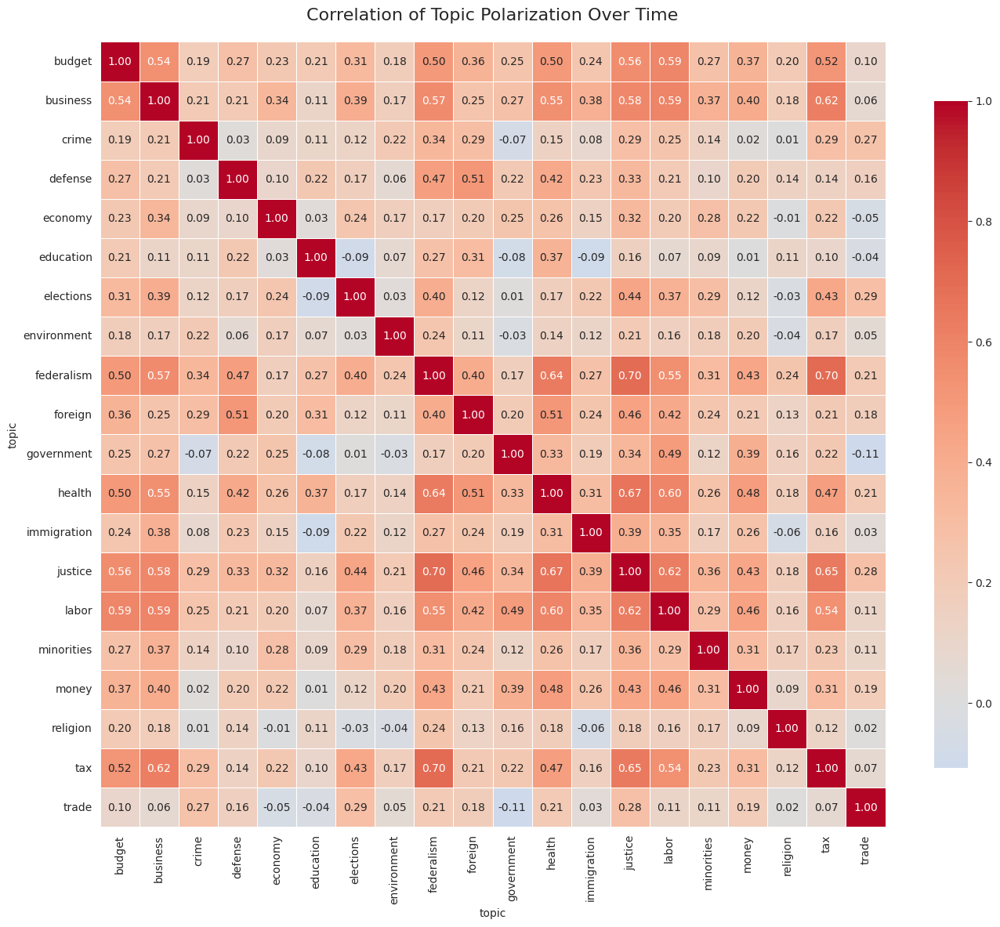


=== CORRELATION MATRIX (Polarization) ===

topic        budget  business  crime  defense  economy  education  elections  \
topic                                                                          
budget        1.000     0.538  0.186    0.273    0.229      0.208      0.315   
business      0.538     1.000  0.205    0.208    0.339      0.115      0.391   
crime         0.186     0.205  1.000    0.025    0.093      0.109      0.122   
defense       0.273     0.208  0.025    1.000    0.103      0.223      0.171   
economy       0.229     0.339  0.093    0.103    1.000      0.034      0.236   
education     0.208     0.115  0.109    0.223    0.034      1.000     -0.090   
elections     0.315     0.391  0.122    0.171    0.236     -0.090      1.000   
environment   0.178     0.167  0.219    0.059    0.167      0.069      0.026   
federalism    0.497     0.568  0.344    0.471    0.169      0.270      0.396   
foreign       0.364     0.254  0.290    0.511    0.200      0.309      0.123

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

polar_matrix = topic_quarter.pivot(
    index='quarter',
    columns='topic',
    values='Abs_Polarization'
)

polar_matrix = polar_matrix.dropna(axis=1, thresh=int(len(polar_matrix) * 0.6))

polar_matrix = polar_matrix.fillna(method='ffill').fillna(method='bfill')

corr_matrix = polar_matrix.corr()

plt.figure(figsize=(14, 12))
sns.heatmap(
    corr_matrix,
    cmap='coolwarm',
    center=0,
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    square=True,
    cbar_kws={"shrink": 0.8}
)

plt.title("Correlation of Topic Polarization Over Time", fontsize=16, pad=20)
plt.tight_layout()
plt.show()

print("\n=== CORRELATION MATRIX (Polarization) ===\n")
print(corr_matrix.round(3))


/tmp/ipython-input-2685801909.py:11: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  polar_matrix = polar_matrix.fillna(method='ffill').fillna(method='bfill')


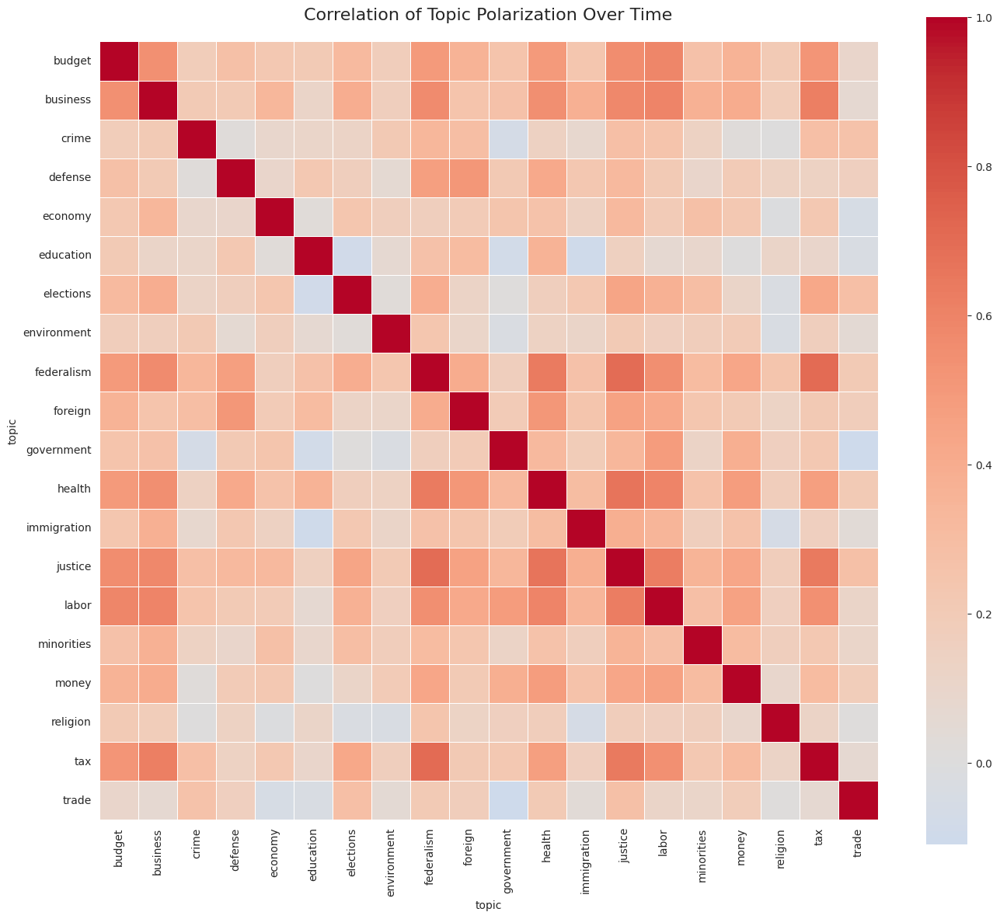


=== CORRELATION MATRIX (Polarization) ===

topic        budget  business  crime  defense  economy  education  elections  \
topic                                                                          
budget        1.000     0.538  0.186    0.273    0.229      0.208      0.315   
business      0.538     1.000  0.205    0.208    0.339      0.115      0.391   
crime         0.186     0.205  1.000    0.025    0.093      0.109      0.122   
defense       0.273     0.208  0.025    1.000    0.103      0.223      0.171   
economy       0.229     0.339  0.093    0.103    1.000      0.034      0.236   
education     0.208     0.115  0.109    0.223    0.034      1.000     -0.090   
elections     0.315     0.391  0.122    0.171    0.236     -0.090      1.000   
environment   0.178     0.167  0.219    0.059    0.167      0.069      0.026   
federalism    0.497     0.568  0.344    0.471    0.169      0.270      0.396   
foreign       0.364     0.254  0.290    0.511    0.200      0.309      0.123

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

polar_matrix = topic_quarter.pivot(index='quarter',
                                   columns='topic',
                                   values='Abs_Polarization')

polar_matrix = polar_matrix.dropna(axis=1, thresh=int(len(polar_matrix) * 0.6))

polar_matrix = polar_matrix.fillna(method='ffill').fillna(method='bfill')

corr_matrix = polar_matrix.corr()

plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, cmap='coolwarm', center=0,
            annot=False, linewidths=0.5, square=True)

plt.title("Correlation of Topic Polarization Over Time", fontsize=16, pad=20)
plt.tight_layout()
plt.show()

print("\n=== CORRELATION MATRIX (Polarization) ===\n")
print(corr_matrix.round(3))


Topics retained (>= 6000 speeches):
['budget', 'business', 'crime', 'defense', 'education', 'federalism', 'foreign', 'government', 'health', 'immigration', 'justice', 'labor', 'minorities', 'tax', 'trade']

Explained variance ratios:
PC1: 21.0%
PC2: 13.1%


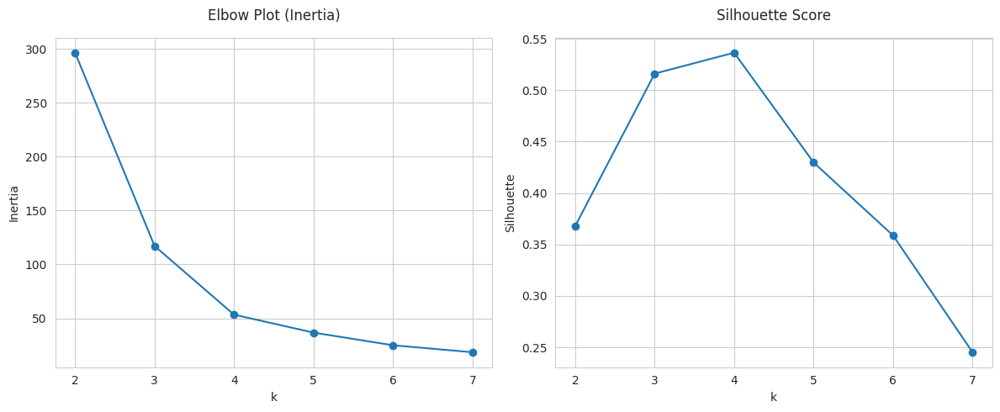


(k, inertia, silhouette):
k=2: inertia=296.4, silhouette=0.368
k=3: inertia=117.1, silhouette=0.516
k=4: inertia=53.4, silhouette=0.536
k=5: inertia=36.8, silhouette=0.430
k=6: inertia=25.0, silhouette=0.359
k=7: inertia=18.6, silhouette=0.245


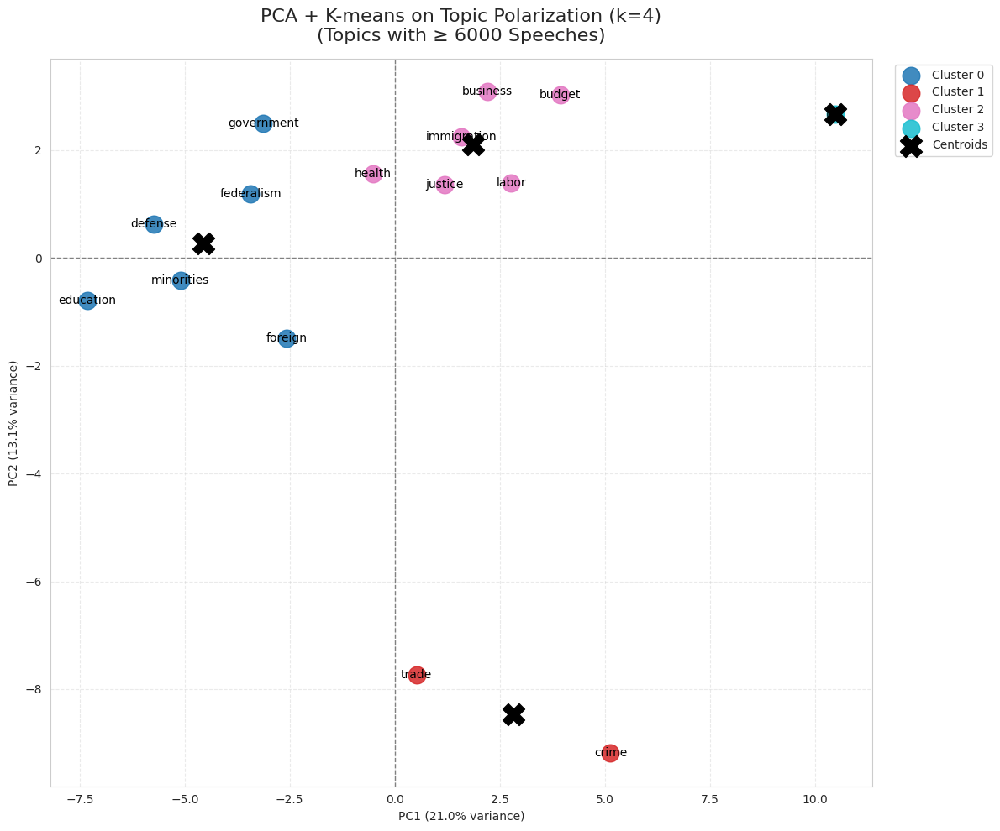


=== TOPIC CLUSTERS (Filtered: ≥ 6000 speeches) ===

   PC1    PC2       topic  cluster
-5.743  0.621     defense        0
-2.577 -1.490     foreign        0
-3.426  1.179  federalism        0
-7.311 -0.790   education        0
-3.131  2.486  government        0
-5.099 -0.416  minorities        0
 0.518 -7.731       trade        1
 5.135 -9.189       crime        1
 2.203  3.079    business        2
 3.937  3.026      budget        2
-0.518  1.560      health        2
 1.584  2.248 immigration        2
 2.769  1.390       labor        2
 1.178  1.361     justice        2
10.480  2.666         tax        3


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

df = df.copy()


df['date'] = pd.to_datetime(df['date'], errors='coerce')
df = df.dropna(subset=['date'])
df['quarter'] = df['date'].dt.to_period('Q')

#Filter topics by speech count (>= 6000 speeches)
topic_counts = df.groupby('topic').size().reset_index(name='speech_count')
valid_topics = topic_counts[topic_counts['speech_count'] >= 6000]['topic']

print("Topics retained (>= 6000 speeches):")
print(valid_topics.to_list())

df_f = df[df['topic'].isin(valid_topics)].copy()

topic_party = (
    df_f
    .groupby(['topic', 'quarter', 'party'])['final_sentiment_label']
    .mean()
    .unstack()
)

topic_party = topic_party.rename(columns={
    'Democratic': 'Democratic_Avg',
    'Republican': 'Republican_Avg'
})

topic_party = topic_party.dropna(subset=['Democratic_Avg', 'Republican_Avg'], how='any')

topic_party['Abs_Polarization'] = (
    topic_party['Republican_Avg'] - topic_party['Democratic_Avg']
).abs()

topic_party = topic_party.reset_index()

polar_matrix = topic_party.pivot(
    index='topic',
    columns='quarter',
    values='Abs_Polarization'
)

polar_matrix = polar_matrix.sort_index(axis=1)
polar_matrix = polar_matrix.ffill(axis=1).bfill(axis=1)

#PCA
X = polar_matrix.values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
coords = pca.fit_transform(X_scaled)

topic_coords = pd.DataFrame(coords, columns=['PC1', 'PC2'])
topic_coords['topic'] = polar_matrix.index

print("\nExplained variance ratios:")
print(f"PC1: {pca.explained_variance_ratio_[0]*100:.1f}%")
print(f"PC2: {pca.explained_variance_ratio_[1]*100:.1f}%")

#Elbow & silhouette
X_pca = topic_coords[['PC1', 'PC2']].values
max_k = min(7, len(topic_coords) - 1)

ks = range(2, max_k + 1)
inertias = []
silhouettes = []

for k in ks:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(X_pca)
    inertias.append(km.inertia_)
    silhouettes.append(silhouette_score(X_pca, labels))

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(ks, inertias, marker='o')
plt.title("Elbow Plot (Inertia)")
plt.xlabel("k")
plt.ylabel("Inertia")

plt.subplot(1,2,2)
plt.plot(ks, silhouettes, marker='o')
plt.title("Silhouette Score")
plt.xlabel("k")
plt.ylabel("Silhouette")

plt.tight_layout()
plt.show()

print("\n(k, inertia, silhouette):")
for k, ine, sil in zip(ks, inertias, silhouettes):
    print(f"k={k}: inertia={ine:.1f}, silhouette={sil:.3f}")

#k
BEST_K = 4
kmeans = KMeans(n_clusters=BEST_K, random_state=42, n_init=10)
topic_coords['cluster'] = kmeans.fit_predict(X_pca)
centroids = kmeans.cluster_centers_

#PCA plot with clusters
plt.figure(figsize=(12,10))
colors = plt.cm.tab10(np.linspace(0, 1, BEST_K))

for k in range(BEST_K):
    sub = topic_coords[topic_coords['cluster'] == k]
    plt.scatter(sub['PC1'], sub['PC2'],
                s=220, color=colors[k], alpha=0.85, label=f"Cluster {k}")
    for _, row in sub.iterrows():
        plt.text(row['PC1'], row['PC2'], row['topic'],
                 fontsize=10, ha='center', va='center', color='black')

# centroids
plt.scatter(centroids[:,0], centroids[:,1],
            s=350, c='black', marker='X', label='Centroids')


plt.axhline(0, color='gray', linestyle='--', linewidth=1)
plt.axvline(0, color='gray', linestyle='--', linewidth=1)

plt.title(f"PCA + K-means on Topic Polarization (k={BEST_K})\n(Topics with ≥ 6000 Speeches)", fontsize=16)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)")
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

print("\n=== TOPIC CLUSTERS (Filtered: ≥ 6000 speeches) ===\n")
print(topic_coords.sort_values('cluster').to_string(index=False))


### 2.4 Event Selection and Design
<a name="section-24-event-selection-and-design"></a>

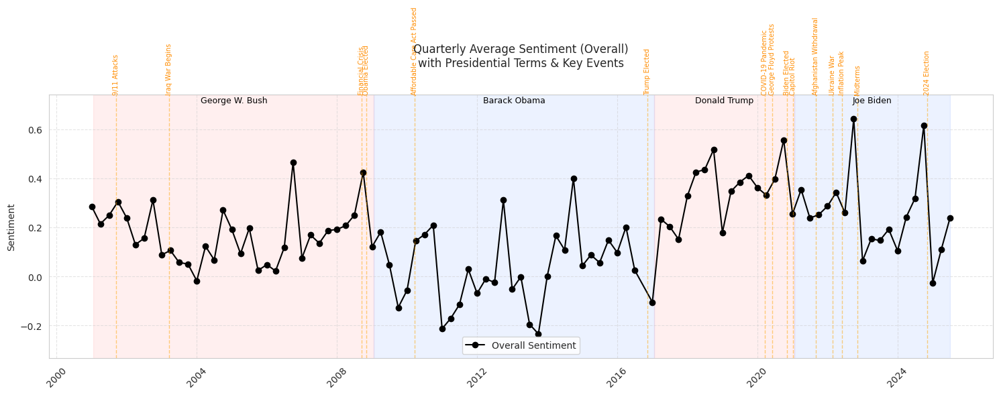

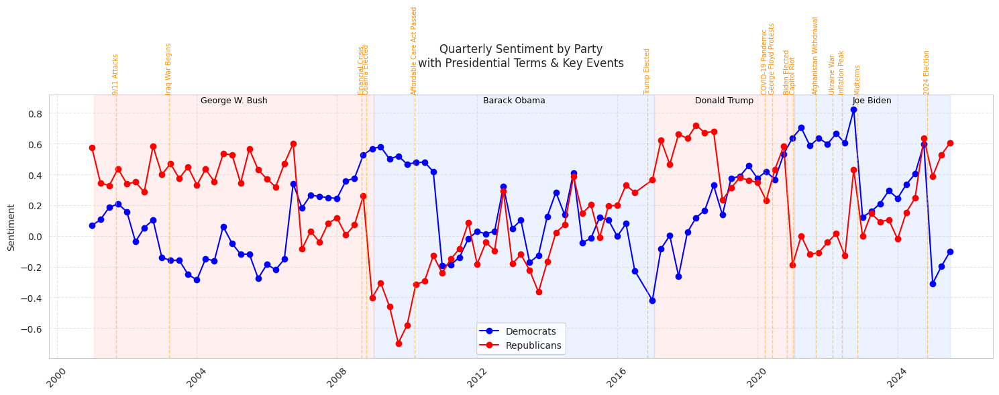

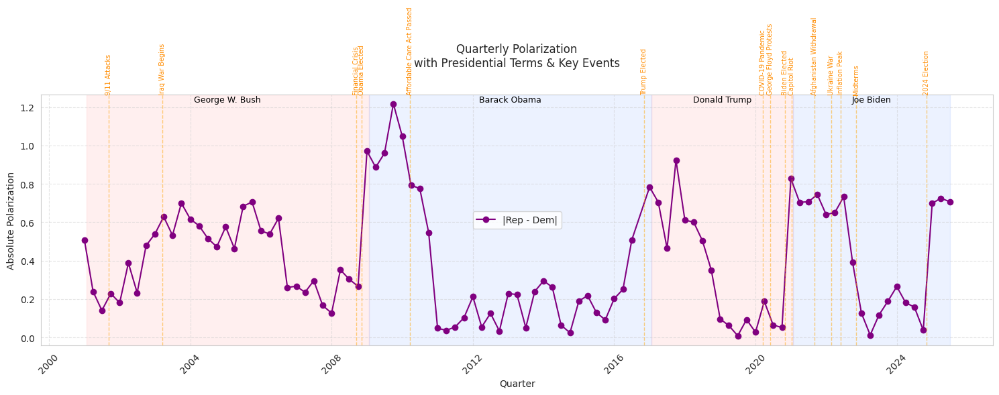

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

#Key events
events = [
    ("9/11 Attacks", "2001-09-11"),
    ("Iraq War Begins", "2003-03-20"),
    ("Financial Crisis", "2008-09-15"),
    ("Obama Elected", "2008-11-04"),
    ("Affordable Care Act Passed", "2010-03-23"),
    ("Trump Elected", "2016-11-08"),
    ("COVID-19 Pandemic", "2020-03-15"),
    ("George Floyd Protests", "2020-06-01"),
    ("Biden Elected", "2020-11-03"),
    ("Capitol Riot", "2021-01-06"),
    ("Afghanistan Withdrawal", "2021-08-30"),
    ("Inflation Peak", "2022-06-01"),
    ("Ukraine War", "2022-02-24"),
    ("Midterms", "2022-11-08"),
    ("2024 Election", "2024-11-05"),
]

events_df = pd.DataFrame(events, columns=["event", "date"])
events_df["date"] = pd.to_datetime(events_df["date"])

#Presidential terms
pres_terms = [
    ("George W. Bush", "Republican", "2001-01-20", "2009-01-20"),
    ("Barack Obama",   "Democratic", "2009-01-20", "2017-01-20"),
    ("Donald Trump",   "Republican", "2017-01-20", "2021-01-20"),
    ("Joe Biden",      "Democratic", "2021-01-20", "2100-01-01"),
]

pres_df = pd.DataFrame(pres_terms, columns=["name", "party", "start", "end"])
pres_df["start"] = pd.to_datetime(pres_df["start"])
pres_df["end"]   = pd.to_datetime(pres_df["end"])

party_fill = {
    "Democratic": (0.3, 0.5, 1.0, 0.10),
    "Republican": (1.0, 0.4, 0.4, 0.10),
}

def add_presidential_shading(ax, xmin, xmax):
    """Shade presidential terms and label them just under the title."""
    for _, row in pres_df.iterrows():
        s = max(row["start"], xmin)
        e = min(row["end"],   xmax)
        if s < e:
            ax.axvspan(s, e, color=party_fill[row["party"]], zorder=0)
            mid = s + (e - s) / 2
            ax.text(mid, 0.96, row["name"],
                    ha="center", va="bottom", fontsize=9, color="black",
                    transform=ax.get_xaxis_transform())

def add_event_markers(ax, events_df, ymax):
    for _, row in events_df.iterrows():
        x = row["date"]
        ax.axvline(x, color="orange", linestyle="--", alpha=0.5, linewidth=1)
        ax.text(x, ymax, row["event"],
                rotation=90, fontsize=7,
                ha="center", va="bottom", color="darkorange")


df_plot = df_f.copy()
df_plot["date"] = pd.to_datetime(df_plot["date"], errors="coerce")
df_plot = df_plot.dropna(subset=["date"])
df_plot["quarter"] = df_plot["date"].dt.to_period("Q")
df_plot["party"] = df_plot["party"].astype(str).str.strip().str.capitalize()

overall_q = (
    df_plot.groupby("quarter")["final_sentiment_label"]
           .mean()
           .reset_index()
)
overall_q["date_plot"] = overall_q["quarter"].dt.start_time

party_q = (
    df_plot.groupby(["quarter", "party"])["final_sentiment_label"]
           .mean()
           .unstack()
           .reset_index()
)
party_q["date_plot"] = party_q["quarter"].dt.start_time
party_q = party_q.dropna(subset=["Democratic", "Republican"])

party_q["Abs_Polarization"] = (party_q["Republican"] - party_q["Democratic"]).abs()

xmin = min(overall_q["date_plot"].min(), party_q["date_plot"].min())
xmax = max(overall_q["date_plot"].max(), party_q["date_plot"].max())

#Plot 1

plt.figure(figsize=(15, 6))
ax1 = plt.gca()
add_presidential_shading(ax1, xmin, xmax)

ax1.plot(overall_q["date_plot"], overall_q["final_sentiment_label"],
         marker="o", linestyle="-", color="black", label="Overall Sentiment")

ymin1 = overall_q["final_sentiment_label"].min() - 0.1
ymax1 = overall_q["final_sentiment_label"].max() + 0.1
add_event_markers(ax1, events_df, ymax1)

plt.title("Quarterly Average Sentiment (Overall)\nwith Presidential Terms & Key Events", pad=30)
plt.ylabel("Sentiment")
plt.grid(True, linestyle="--", alpha=0.5)
plt.ylim(ymin1, ymax1)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

#Plot 2

plt.figure(figsize=(15, 6))
ax2 = plt.gca()
add_presidential_shading(ax2, xmin, xmax)

ax2.plot(party_q["date_plot"], party_q["Democratic"],
         marker="o", linestyle="-", color="blue", label="Democrats")
ax2.plot(party_q["date_plot"], party_q["Republican"],
         marker="o", linestyle="-", color="red", label="Republicans")

ymin2 = party_q[["Democratic", "Republican"]].min().min() - 0.1
ymax2 = party_q[["Democratic", "Republican"]].max().max() + 0.1
add_event_markers(ax2, events_df, ymax2)

plt.title("Quarterly Sentiment by Party\nwith Presidential Terms & Key Events", pad=30)
plt.ylabel("Sentiment")
plt.grid(True, linestyle="--", alpha=0.5)
plt.ylim(ymin2, ymax2)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

#Plot 3
plt.figure(figsize=(15, 6))
ax3 = plt.gca()
add_presidential_shading(ax3, xmin, xmax)

ax3.plot(party_q["date_plot"], party_q["Abs_Polarization"],
         marker="o", linestyle="-", color="purple", label="|Rep - Dem|")

ymin3 = party_q["Abs_Polarization"].min() - 0.05
ymax3 = party_q["Abs_Polarization"].max() + 0.05
add_event_markers(ax3, events_df, ymax3)

plt.title("Quarterly Polarization\nwith Presidential Terms & Key Events", pad=30)
plt.xlabel("Quarter")
plt.ylabel("Absolute Polarization")
plt.grid(True, linestyle="--", alpha=0.5)
plt.ylim(ymin3, ymax3)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()



=== BUSINESS — 2001Q1 → 2025Q1 (Levels + QoQ & YoY) ===

Quarter  Mean_Sentiment_Democratic  Mean_Sentiment_Republican  Avg_Total_Sentiment  Abs_Polarization  Democratic_QoQ_%  Republican_QoQ_%  Overall_QoQ_%  Polarization_QoQ_%  Democratic_YoY_%  Republican_YoY_%  Overall_YoY_%  Polarization_YoY_%
 2001Q1                     -0.128                      0.220                0.046             0.349               NaN               NaN            NaN                 NaN               NaN               NaN            NaN                 NaN
 2001Q2                     -0.258                      0.308                0.025             0.565           100.663            39.645        -45.635              62.115               NaN               NaN            NaN                 NaN
 2001Q3                     -0.110                      0.260                0.075             0.371           -57.284           -15.365        200.888             -34.472               NaN               NaN      

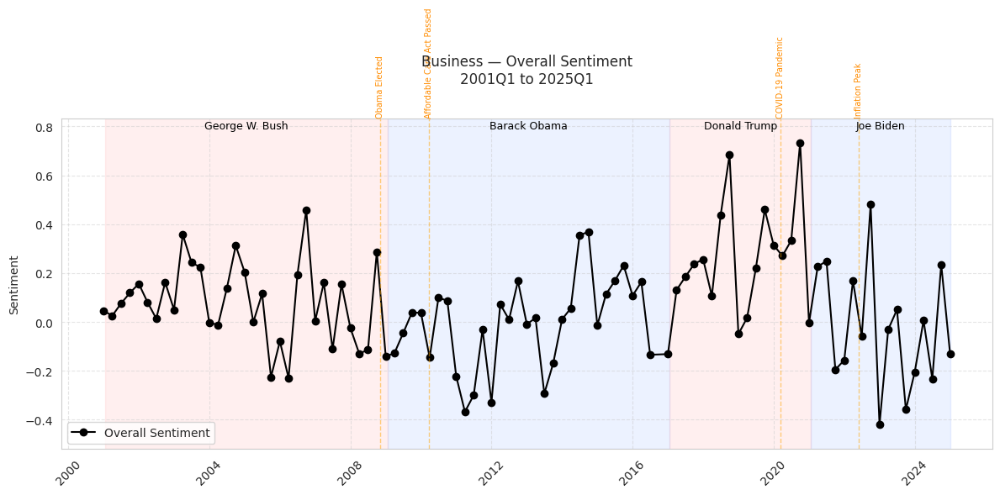

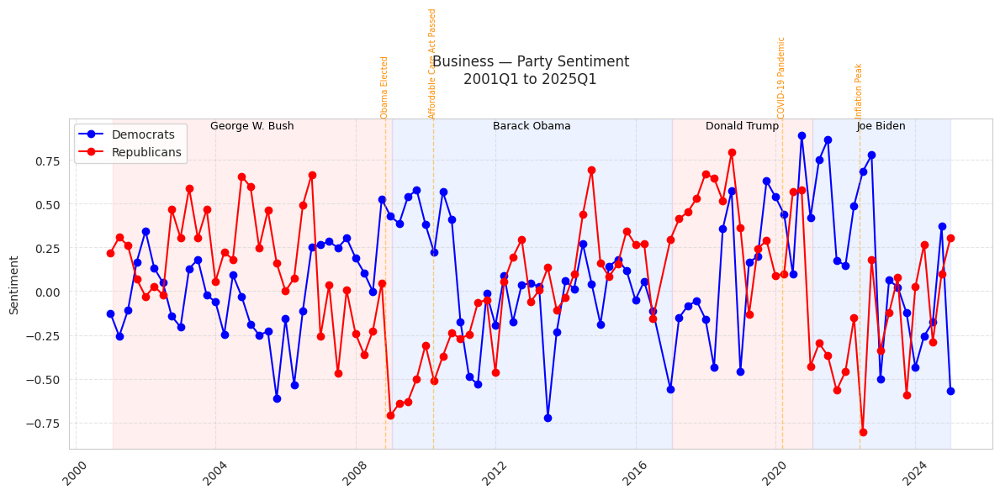

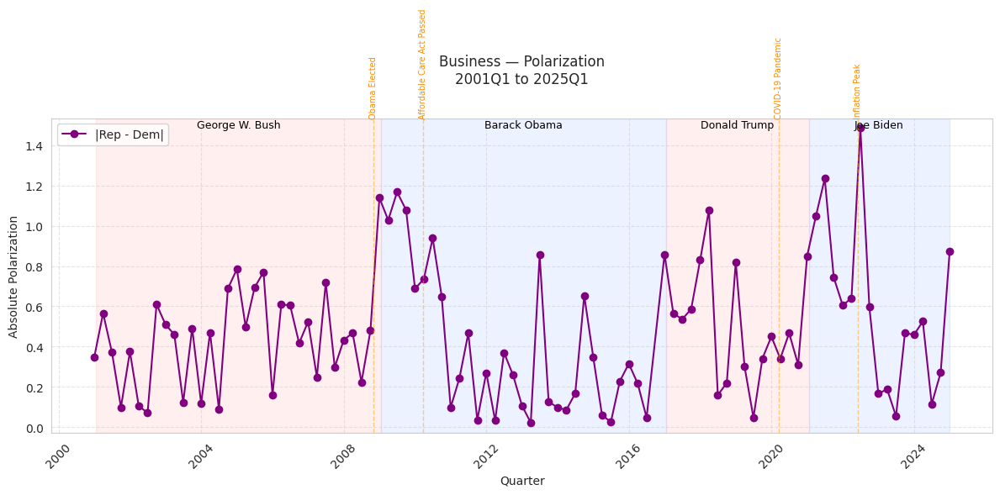

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

topic   = "business"
start_q = "2001Q1"
end_q   = "2025Q1"


start_p = pd.Period(start_q, freq="Q")
end_p   = pd.Period(end_q,   freq="Q")

tq = (
    topic_quarter
    .loc[(topic_quarter["topic"] == topic) &
         (topic_quarter["quarter"] >= start_p) &
         (topic_quarter["quarter"] <= end_p),
         ["quarter","Mean_Sentiment_Democratic","Mean_Sentiment_Republican",
          "Avg_Total_Sentiment","Abs_Polarization"]]
    .sort_values("quarter")
    .reset_index(drop=True)
).copy()

#QoQ (% change vs previous quarter)
tq["Democratic_QoQ_%"]   = tq["Mean_Sentiment_Democratic"].pct_change(1) * 100
tq["Republican_QoQ_%"]   = tq["Mean_Sentiment_Republican"].pct_change(1) * 100
tq["Overall_QoQ_%"]      = tq["Avg_Total_Sentiment"].pct_change(1) * 100
tq["Polarization_QoQ_%"] = tq["Abs_Polarization"].pct_change(1) * 100

#YoY (% change vs same quarter last year)
tq["Democratic_YoY_%"]   = tq["Mean_Sentiment_Democratic"].pct_change(4) * 100
tq["Republican_YoY_%"]   = tq["Mean_Sentiment_Republican"].pct_change(4) * 100
tq["Overall_YoY_%"]      = tq["Avg_Total_Sentiment"].pct_change(4) * 100
tq["Polarization_YoY_%"] = tq["Abs_Polarization"].pct_change(4) * 100


out = tq.copy()
out["Quarter"] = out["quarter"].astype(str)
cols = ["Quarter","Mean_Sentiment_Democratic","Mean_Sentiment_Republican",
        "Avg_Total_Sentiment","Abs_Polarization",
        "Democratic_QoQ_%","Republican_QoQ_%","Overall_QoQ_%","Polarization_QoQ_%",
        "Democratic_YoY_%","Republican_YoY_%","Overall_YoY_%","Polarization_YoY_%"]
out = out[cols]

pd.set_option("display.max_rows", None)
pd.set_option("display.float_format", "{:.3f}".format)
print(f"\n=== {topic.upper()} — {start_q} → {end_q} (Levels + QoQ & YoY) ===\n")
print(out.to_string(index=False))

#Plots

tq["date_plot"] = tq["quarter"].dt.start_time

events = [
    ("Obama Elected", "2008-11-04"),
    ("Affordable Care Act Passed", "2010-03-23"),
    ("COVID-19 Pandemic", "2020-03-15"),
    ("Inflation Peak", "2022-06-01"),
]
events_df = pd.DataFrame(events, columns=["event","date"])
events_df["date"] = pd.to_datetime(events_df["date"])

xmin = tq["date_plot"].min()
xmax = tq["date_plot"].max()
events_win = events_df[(events_df["date"] >= xmin) & (events_df["date"] <= xmax)]

pres_terms = [
    ("George W. Bush", "Republican", "2001-01-20", "2009-01-20"),
    ("Barack Obama",   "Democratic", "2009-01-20", "2017-01-20"),
    ("Donald Trump",   "Republican", "2017-01-20", "2021-01-20"),
    ("Joe Biden",      "Democratic", "2021-01-20", "2100-01-01"),
]
pres_df = pd.DataFrame(pres_terms, columns=["name","party","start","end"])
pres_df["start"] = pd.to_datetime(pres_df["start"])
pres_df["end"]   = pd.to_datetime(pres_df["end"])

party_fill = {
    "Democratic": (0.3, 0.5, 1.0, 0.10),
    "Republican": (1.0, 0.4, 0.4, 0.10),
}

def add_presidential_shading(ax, xmin, xmax):
    for _, row in pres_df.iterrows():
        s = max(row["start"], xmin)
        e = min(row["end"],   xmax)
        if s < e:
            ax.axvspan(s, e, color=party_fill[row["party"]], zorder=0)
            mid = s + (e - s) / 2
            ax.text(mid, 0.96, row["name"],
                    ha="center", va="bottom", fontsize=9, color="black",
                    transform=ax.get_xaxis_transform())

def add_event_markers(ax, events_df, ymax):
    for _, row in events_df.iterrows():
        x = row["date"]
        ax.axvline(x, color="orange", linestyle="--", alpha=0.5, linewidth=1)
        ax.text(x, ymax, row["event"],
                rotation=90, fontsize=7,
                ha="center", va="bottom", color="darkorange")

#Plot 1
plt.figure(figsize=(12,6))
ax1 = plt.gca()
add_presidential_shading(ax1, xmin, xmax)

ax1.plot(tq["date_plot"], tq["Avg_Total_Sentiment"],
         marker="o", linestyle="-", color="black", label="Overall Sentiment")

ymin1 = tq["Avg_Total_Sentiment"].min() - 0.1
ymax1 = tq["Avg_Total_Sentiment"].max() + 0.1
add_event_markers(ax1, events_win, ymax1)

plt.title(f"{topic.title()} — Overall Sentiment\n{start_q} to {end_q}", pad=30)
plt.ylabel("Sentiment")
plt.grid(True, linestyle="--", alpha=0.5)
plt.ylim(ymin1, ymax1)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

#Plot 2
plt.figure(figsize=(12,6))
ax2 = plt.gca()
add_presidential_shading(ax2, xmin, xmax)

ax2.plot(tq["date_plot"], tq["Mean_Sentiment_Democratic"],
         marker="o", linestyle="-", color="blue", label="Democrats")
ax2.plot(tq["date_plot"], tq["Mean_Sentiment_Republican"],
         marker="o", linestyle="-", color="red", label="Republicans")

ymin2 = tq[["Mean_Sentiment_Democratic","Mean_Sentiment_Republican"]].min().min() - 0.1
ymax2 = tq[["Mean_Sentiment_Democratic","Mean_Sentiment_Republican"]].max().max() + 0.1
add_event_markers(ax2, events_win, ymax2)

plt.title(f"{topic.title()} — Party Sentiment\n{start_q} to {end_q}", pad=30)
plt.ylabel("Sentiment")
plt.grid(True, linestyle="--", alpha=0.5)
plt.ylim(ymin2, ymax2)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

#Plot 3
plt.figure(figsize=(12,6))
ax3 = plt.gca()
add_presidential_shading(ax3, xmin, xmax)

ax3.plot(tq["date_plot"], tq["Abs_Polarization"],
         marker="o", linestyle="-", color="purple", label="|Rep - Dem|")

ymin3 = tq["Abs_Polarization"].min() - 0.05
ymax3 = tq["Abs_Polarization"].max() + 0.05
add_event_markers(ax3, events_win, ymax3)

plt.title(f"{topic.title()} — Polarization\n{start_q} to {end_q}", pad=30)
plt.xlabel("Quarter")
plt.ylabel("Absolute Polarization")
plt.grid(True, linestyle="--", alpha=0.5)
plt.ylim(ymin3, ymax3)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

### 2.5 GLSAR
<a name="section-25-glsar"></a>

In [ ]:
DATE_COL = 'date'
PARTY_COL = 'party'
SENTIMENT_COL = 'final_sentiment_label'
TOPIC_COL = 'topic'
CONGRESS_COL = 'congress'

meso_df = df[[DATE_COL, PARTY_COL, SENTIMENT_COL, TOPIC_COL, CONGRESS_COL]].copy()

meso_df[SENTIMENT_COL] = pd.to_numeric(meso_df[SENTIMENT_COL], errors='coerce')
meso_df[PARTY_COL] = meso_df[PARTY_COL].astype(str).str.strip().str.capitalize()
meso_df[TOPIC_COL] = meso_df[TOPIC_COL].astype(str).str.strip().str.lower()
meso_df.dropna(subset=[SENTIMENT_COL, TOPIC_COL, CONGRESS_COL], inplace=True)
meso_df = meso_df[meso_df[PARTY_COL].isin(['Democratic', 'Republican'])]

agg = (
    meso_df
    .groupby([TOPIC_COL, CONGRESS_COL, PARTY_COL])[SENTIMENT_COL]
    .agg(['mean', 'count'])
    .rename(columns={'mean': 'mean_sent', 'count': 'n'})
    .reset_index()
)

means_pvt = agg.pivot_table(
    index=[TOPIC_COL, CONGRESS_COL],
    columns=PARTY_COL,
    values='mean_sent'
).reset_index()

means_pvt['polarization'] = (means_pvt['Democratic'] - means_pvt['Republican']).abs()

meso_polar = means_pvt.copy()

count_pvt = agg.pivot_table(index=[TOPIC_COL, CONGRESS_COL], columns=PARTY_COL, values='n')
meso_counts = count_pvt.reset_index()

print(" Meso-level polarization:")
print(meso_polar.to_string(index=False))
print(f"\nTotal topic–Congress combinations: {len(meso_polar)}")
print(f"Unique topics: {meso_polar['topic'].nunique()}")

 Meso-level polarization:
      topic  congress  Democratic  Republican  polarization
    alcohol       107       0.200      -1.000         1.200
    alcohol       108       1.000      -1.000         2.000
    alcohol       109       0.714       0.600         0.114
    alcohol       110       0.500       1.000         0.500
    alcohol       111       1.000       1.000         0.000
    alcohol       112       1.000       1.000         0.000
    alcohol       114         NaN      -1.000           NaN
    alcohol       115       1.000       1.000         0.000
    alcohol       116       1.000         NaN           NaN
    alcohol       118         NaN      -1.000           NaN
    alcohol       119         NaN       1.000           NaN
     budget       107      -0.361      -0.004         0.357
     budget       108      -0.560       0.180         0.739
     budget       109      -0.603       0.256         0.859
     budget       110       0.106      -0.269         0.375
     budget   

In [ ]:
topic_counts = meso_polar['topic'].value_counts().reset_index()
topic_counts.columns = ['topic', 'num_congress_sessions']

print(" Topics represented in meso_polar (sorted by coverage):")
print(topic_counts.to_string(index=False))

 Topics represented in meso_polar (sorted by coverage):
      topic  num_congress_sessions
     budget                     13
   business                     13
    defense                     13
      crime                     13
    economy                     13
  education                     13
    justice                     13
  elections                     13
environment                     13
 federalism                     13
    foreign                     13
 government                     13
     health                     13
immigration                     13
      money                     13
      labor                     13
       mail                     13
 minorities                     13
        tax                     13
   religion                     13
      trade                     13
    alcohol                     11


In [ ]:
meso_df[DATE_COL] = pd.to_datetime(meso_df[DATE_COL])

meso_df['year'] = meso_df[DATE_COL].dt.year
meso_df['month'] = meso_df[DATE_COL].dt.month

agg_month_nTopic = (
    meso_df
    .groupby(['year', 'month', PARTY_COL])[SENTIMENT_COL]
    .agg(['mean', 'count'])
    .rename(columns={'mean': 'mean_sent', 'count': 'n'})
    .reset_index()
)

means_month_pvt_nTopic = agg_month_nTopic.pivot_table(
    index=['year', 'month'],
    columns=PARTY_COL,
    values='mean_sent'
).reset_index()

means_month_pvt_nTopic['polarization'] = (
    means_month_pvt_nTopic['Democratic'] - means_month_pvt_nTopic['Republican']
).abs()

meso_month_polar_no_topic = means_month_pvt_nTopic.copy()

print("Monthly polarization (no topic, Democrats vs Republicans):")
print(meso_month_polar_no_topic.to_string(index=False))

Monthly polarization (no topic, Democrats vs Republicans):
 year  month  Democratic  Republican  polarization
 2001      1       0.294       0.766         0.472
 2001      2       0.344       0.757         0.413
 2001      3      -0.096       0.419         0.515
 2001      4       0.052       0.408         0.356
 2001      5      -0.065       0.441         0.505
 2001      6       0.323       0.201         0.122
 2001      7       0.137       0.226         0.088
 2001      8       0.065       0.428         0.363
 2001      9       0.338       0.438         0.100
 2001     10       0.280       0.460         0.180
 2001     11       0.162       0.401         0.239
 2001     12       0.161       0.448         0.287
 2002      1       0.359       0.491         0.132
 2002      2       0.204       0.268         0.064
 2002      3       0.118       0.314         0.197
 2002      4       0.056       0.384         0.328
 2002      5      -0.028       0.341         0.369
 2002      6      -0.09

In [ ]:

meso_df[DATE_COL] = pd.to_datetime(meso_df[DATE_COL])

meso_df['year'] = meso_df[DATE_COL].dt.year
meso_df['month'] = meso_df[DATE_COL].dt.month

agg_party_month_no_topic = (
    meso_df
    .groupby(['year', 'month', PARTY_COL])[SENTIMENT_COL]
    .mean()
    .reset_index()
)

agg_party_month_no_topic = agg_party_month_no_topic[
    agg_party_month_no_topic[PARTY_COL].isin(['Democratic', 'Republican'])
]

print(agg_party_month_no_topic.head())

   year  month       party  final_sentiment_label
0  2001      1  Democratic                  0.294
1  2001      1  Republican                  0.766
2  2001      2  Democratic                  0.344
3  2001      2  Republican                  0.757
4  2001      3  Democratic                 -0.096



Within-year GLSAR betas (no topic, per party, per year):
     party  year  beta_within_year  p_value  r2_adj  n_months
Democratic  2001             0.012    0.428  -0.032        12
Democratic  2002             0.012    0.546  -0.072        11
Democratic  2003            -0.012    0.674  -0.088        12
Democratic  2004             0.050    0.005   0.603        11
Democratic  2005            -0.016    0.161   0.133        11
Democratic  2006             0.064    0.008   0.560        11
Democratic  2007             0.020    0.034   0.344        12
Democratic  2008             0.034    0.046   0.304        12
Democratic  2009             0.001    0.790  -0.102        12
Democratic  2010             0.001    0.923  -0.124        11
Democratic  2011             0.033    0.022   0.399        12
Democratic  2012             0.033    0.014   0.497        11
Democratic  2013             0.004    0.884  -0.108        12
Democratic  2014             0.005    0.897  -0.122        11
Democratic  

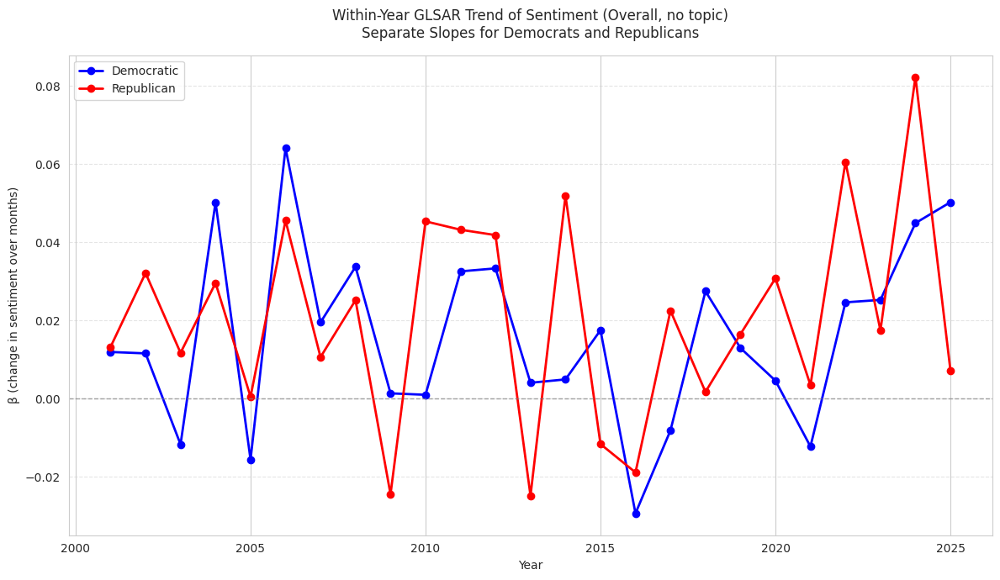

In [ ]:
import statsmodels.api as sm
import numpy as np
import pandas as pd

party_yearly_rows = []

for party in ['Democratic', 'Republican']:

    s_party = agg_party_month_no_topic[
        agg_party_month_no_topic[PARTY_COL] == party
    ].copy()

    years = np.sort(s_party['year'].unique())

    for y in years:
        s_year = (
            s_party[s_party['year'] == y]
            .dropna(subset=[SENTIMENT_COL])
            .sort_values('month')
            .copy()
        )

        if len(s_year) < 3:
            party_yearly_rows.append({
                'party': party,
                'year': int(y),
                'beta_within_year': np.nan,
                'p_value': np.nan,
                'r2_adj': np.nan,
                'n_months': len(s_year)
            })
            continue

        time_num = s_year['month'].astype(float).values
        y_dep    = s_year[SENTIMENT_COL].values
        X        = sm.add_constant(time_num)

        try:
            mod = sm.GLSAR(y_dep, X, rho=1)
            res = mod.iterative_fit(maxiter=10)

            party_yearly_rows.append({
                'party': party,
                'year': int(y),
                'beta_within_year': res.params[1],
                'p_value': res.pvalues[1],
                'r2_adj': res.rsquared_adj,
                'n_months': len(s_year)
            })

        except Exception as e:
            party_yearly_rows.append({
                'party': party,
                'year': int(y),
                'beta_within_year': np.nan,
                'p_value': np.nan,
                'r2_adj': np.nan,
                'n_months': len(s_year),
                'error': str(e)
            })

party_yearly_beta_no_topic = pd.DataFrame(party_yearly_rows).sort_values(
    ['party', 'year']
)

print("\nWithin-year GLSAR betas (no topic, per party, per year):")
print(party_yearly_beta_no_topic.to_string(index=False))
import matplotlib.pyplot as plt

df_plot = party_yearly_beta_no_topic.dropna(subset=['beta_within_year']).copy()

plt.figure(figsize=(12, 7))

for party, color in [('Democratic', 'blue'), ('Republican', 'red')]:
    s = df_plot[df_plot['party'] == party].sort_values('year')
    plt.plot(
        s['year'],
        s['beta_within_year'],
        marker='o',
        linewidth=2,
        label=party,
        color=color
    )

plt.axhline(0, linestyle='--', linewidth=1, color='gray', alpha=0.7)

plt.title('Within-Year GLSAR Trend of Sentiment (Overall, no topic)\nSeparate Slopes for Democrats and Republicans')
plt.xlabel('Year')
plt.ylabel('β (change in sentiment over months)')
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
meso_df[DATE_COL] = pd.to_datetime(meso_df[DATE_COL])


meso_df['year']  = meso_df[DATE_COL].dt.year
meso_df['month'] = meso_df[DATE_COL].dt.month

agg_party_month = (
    meso_df
    .groupby([TOPIC_COL, 'year', 'month', PARTY_COL])[SENTIMENT_COL]
    .mean()
    .reset_index()
)

agg_party_month = agg_party_month[
    agg_party_month[PARTY_COL].isin(['Democratic', 'Republican'])
]

print(agg_party_month.head())

     topic  year  month       party  final_sentiment_label
0  alcohol  2001      6  Democratic                 -1.000
1  alcohol  2001     11  Democratic                 -1.000
2  alcohol  2002      1  Democratic                  1.000
3  alcohol  2002      2  Republican                 -1.000
4  alcohol  2002     10  Democratic                  1.000


In [ ]:
party_yearly_rows = []

for t in sorted(agg_party_month[TOPIC_COL].unique()):
    s_topic = agg_party_month[agg_party_month[TOPIC_COL] == t].copy()

    if s_topic.empty:
        continue

    for party in ['Democratic', 'Republican']:
        s_tp = s_topic[s_topic[PARTY_COL] == party].copy()

        if s_tp.empty:
            continue

        years = np.sort(s_tp['year'].unique())

        for y in years:
            s_year = (
                s_tp[s_tp['year'] == y]
                .dropna(subset=[SENTIMENT_COL])
                .sort_values('month')
                .copy()
            )

            if len(s_year) < 3:
                party_yearly_rows.append({
                    'topic': t,
                    'party': party,
                    'year': int(y),
                    'beta_within_year': np.nan,
                    'p_value': np.nan,
                    'r2_adj': np.nan,
                    'n_months': len(s_year)
                })
                continue

            time_num = s_year['month'].astype(float).values
            y_dep    = s_year[SENTIMENT_COL].values
            X        = sm.add_constant(time_num)

            try:
                mod = sm.GLSAR(y_dep, X, rho=1)
                res = mod.iterative_fit(maxiter=10)

                party_yearly_rows.append({
                    'topic': t,
                    'party': party,
                    'year': int(y),
                    'beta_within_year': res.params[1],
                    'p_value': res.pvalues[1],
                    'r2_adj': res.rsquared_adj,
                    'n_months': len(s_year)
                })

            except Exception as e:
                party_yearly_rows.append({
                    'topic': t,
                    'party': party,
                    'year': int(y),
                    'beta_within_year': np.nan,
                    'p_value': np.nan,
                    'r2_adj': np.nan,
                    'n_months': len(s_year),
                    'error': str(e)
                })

party_yearly_beta = pd.DataFrame(party_yearly_rows).sort_values(
    ['topic', 'party', 'year']
)

print("\nWithin-year GLSAR betas (per topic, party, year):")
print(party_yearly_beta.to_string(index=False))

/usr/local/lib/python3.12/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/linear_model.py:1336: RuntimeWarning: divide by zero encountered in divide
  diff = np.max(np.abs(last - results.params) / np.abs(last))
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/linear_model.py:1795: RuntimeWarning: divide by zero encountered in divide
  return 1 - (np.divide(self.nobs - self.k_constant, self.df_resid)
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/linear_model.py:1795: RuntimeWarning: invalid value encountered in scalar multiply
  return 1 - (np.divide(self.nobs - self.k_constant, self.df_resid)
/usr/local/lib/python3.12/dist-packages/statsmodels/regression/linear_model.py:1795: RuntimeWarning: divide by zero encountered in divide
  return 1 - (np.divide(self.nobs - self.k_constant, self


Within-year GLSAR betas (per topic, party, year):
      topic      party  year  beta_within_year  p_value  r2_adj  n_months
    alcohol Democratic  2001               NaN      NaN     NaN         2
    alcohol Democratic  2002               NaN      NaN     NaN         2
    alcohol Democratic  2003               NaN      NaN     NaN         1
    alcohol Democratic  2004               NaN      NaN     NaN         1
    alcohol Democratic  2005            -0.000    0.548    -inf         4
    alcohol Democratic  2006               NaN      NaN     NaN         2
    alcohol Democratic  2007             0.213    0.295   0.599         4
    alcohol Democratic  2009               NaN      NaN     NaN         2
    alcohol Democratic  2012               NaN      NaN     NaN         2
    alcohol Democratic  2017               NaN      NaN     NaN         1
    alcohol Democratic  2020               NaN      NaN     NaN         2
    alcohol Republican  2002               NaN      NaN     N

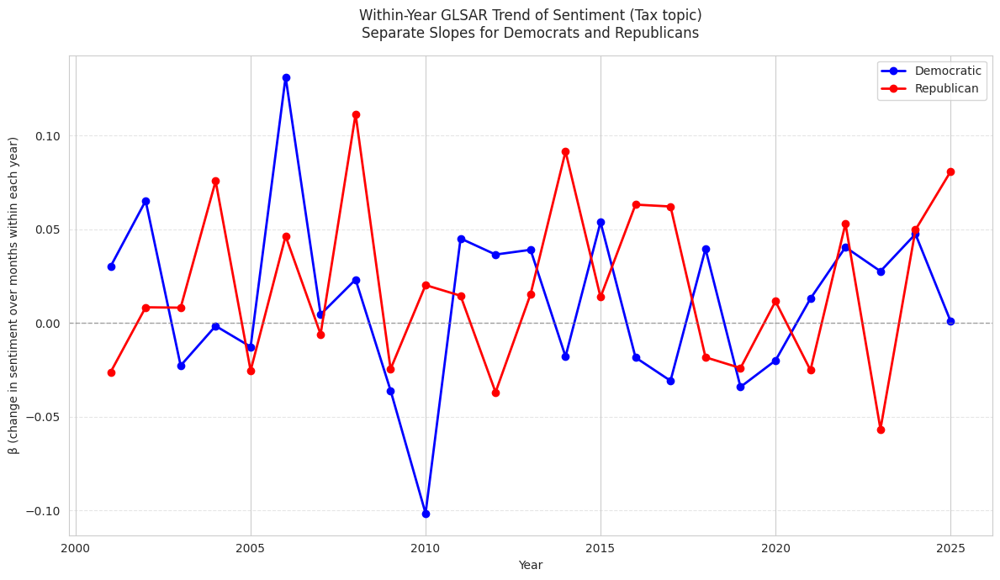

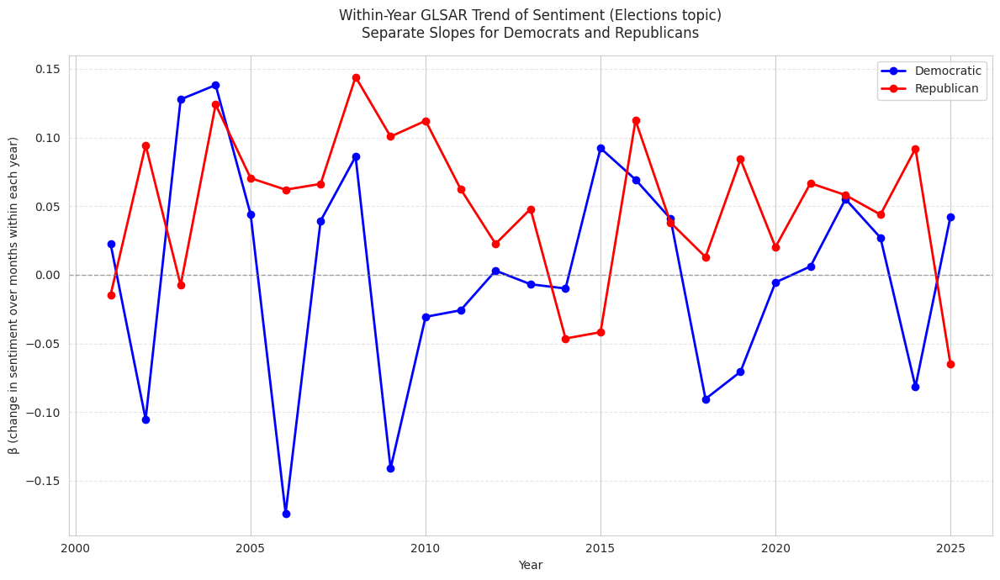

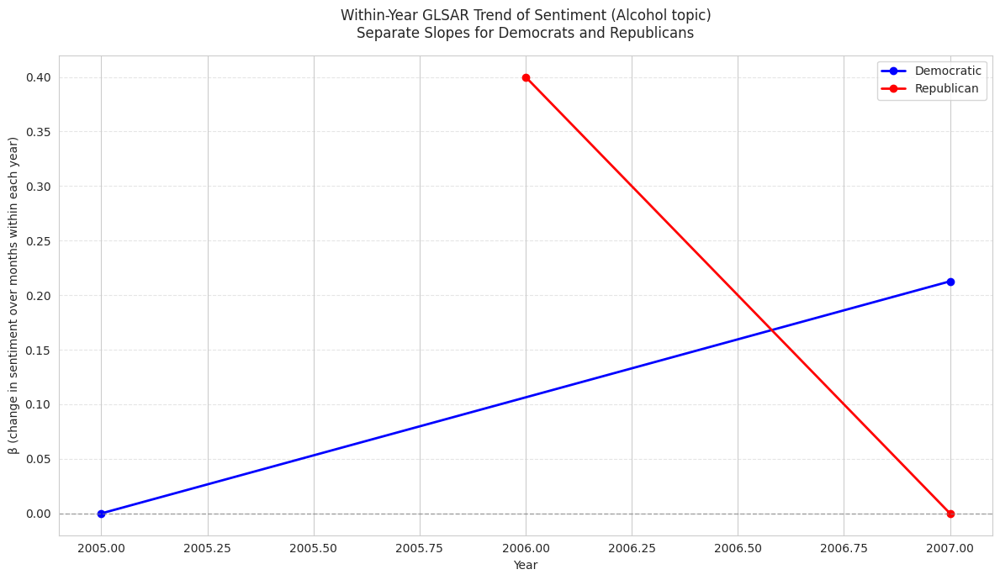

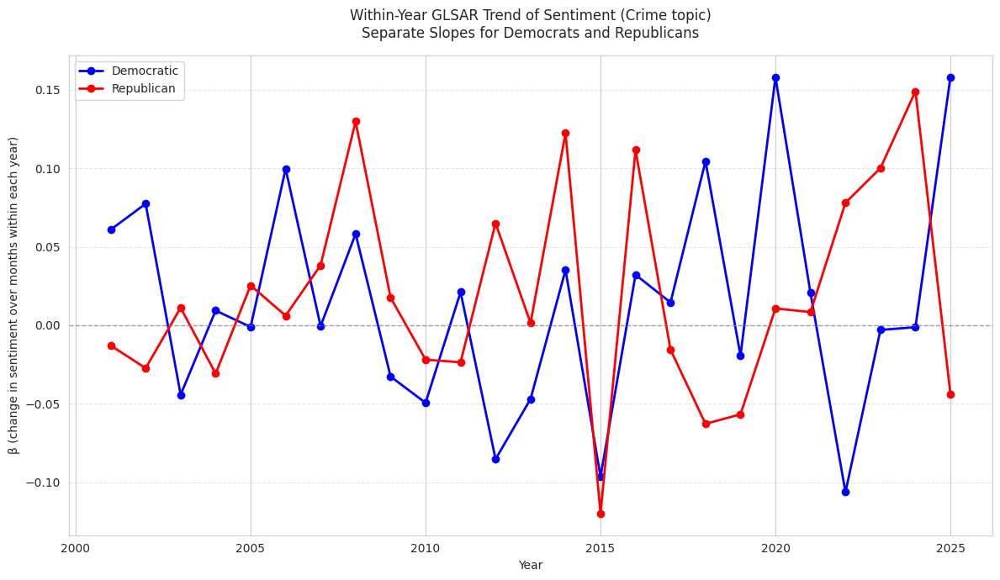

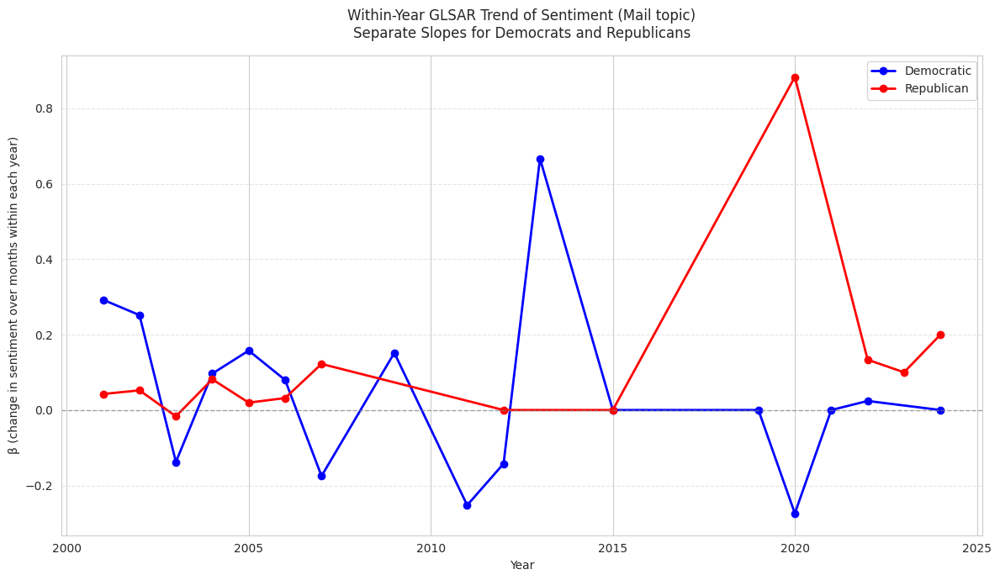

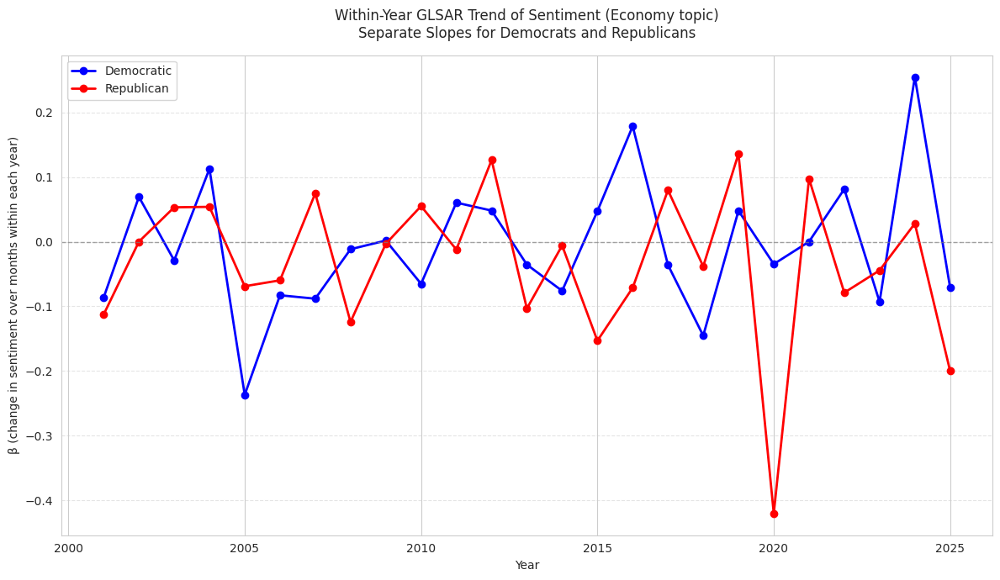

In [ ]:
import matplotlib.pyplot as plt

selected_topics  = ['tax', 'elections', 'alcohol', 'crime', 'mail', 'economy']

for topic in selected_topics:
    df_topic = party_yearly_beta[
        party_yearly_beta[TOPIC_COL] == topic
    ].copy()

    if df_topic.empty:
        print(f"No data for topic: {topic}")
        continue

    plt.figure(figsize=(12, 7))

    for party, color in [('Democratic', 'blue'), ('Republican', 'red')]:
        s = df_topic[df_topic['party'] == party].dropna(subset=['beta_within_year'])
        s = s.sort_values('year')
        if s.empty:
            continue

        plt.plot(
            s['year'],
            s['beta_within_year'],
            marker='o',
            linewidth=2,
            label=party,
            color=color
        )

    plt.axhline(0, linestyle='--', linewidth=1, color='gray', alpha=0.7)

    plt.title(
        f'Within-Year GLSAR Trend of Sentiment ({topic.capitalize()} topic)\n'
        'Separate Slopes for Democrats and Republicans'
    )
    plt.xlabel('Year')
    plt.ylabel('β (change in sentiment over months within each year)')
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()

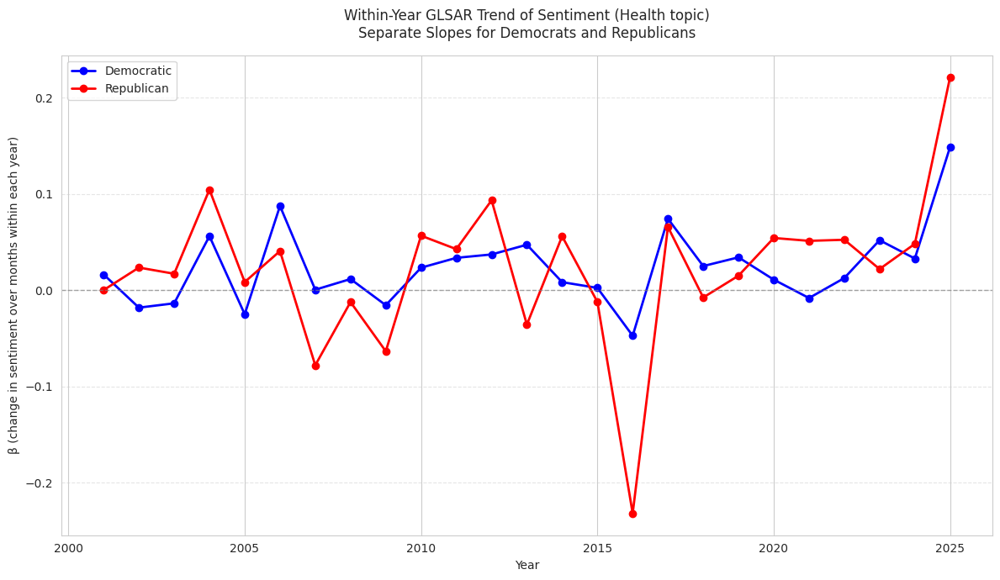

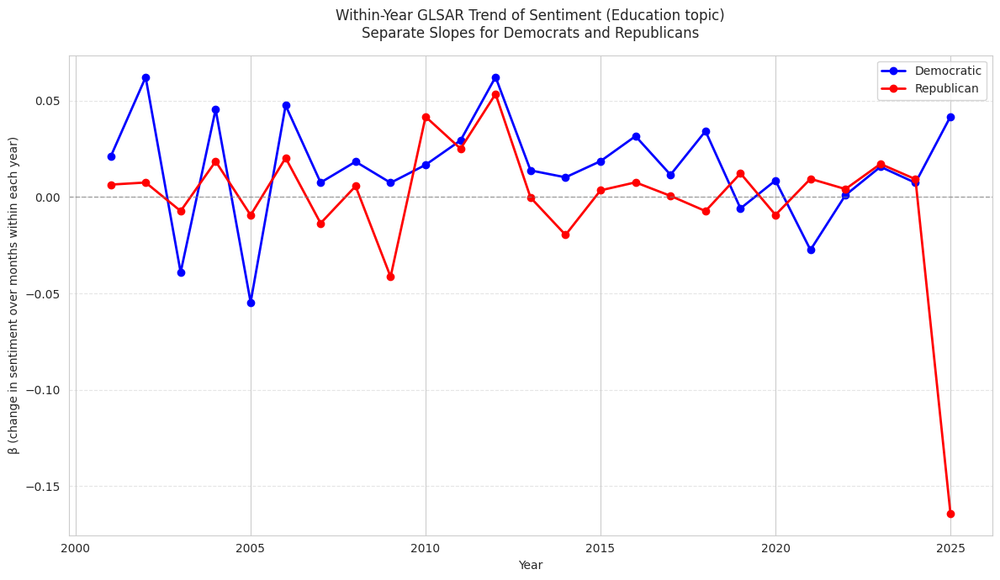

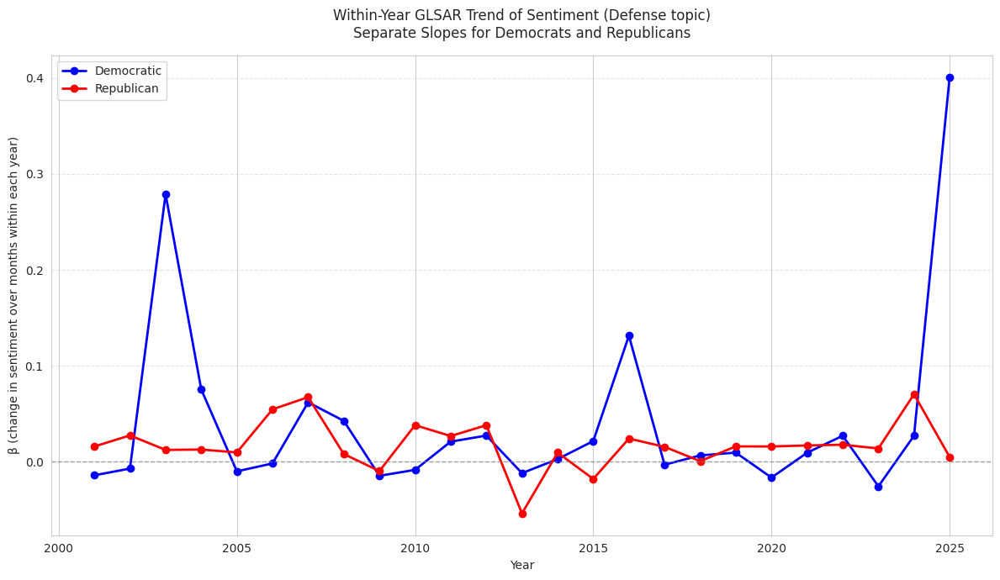

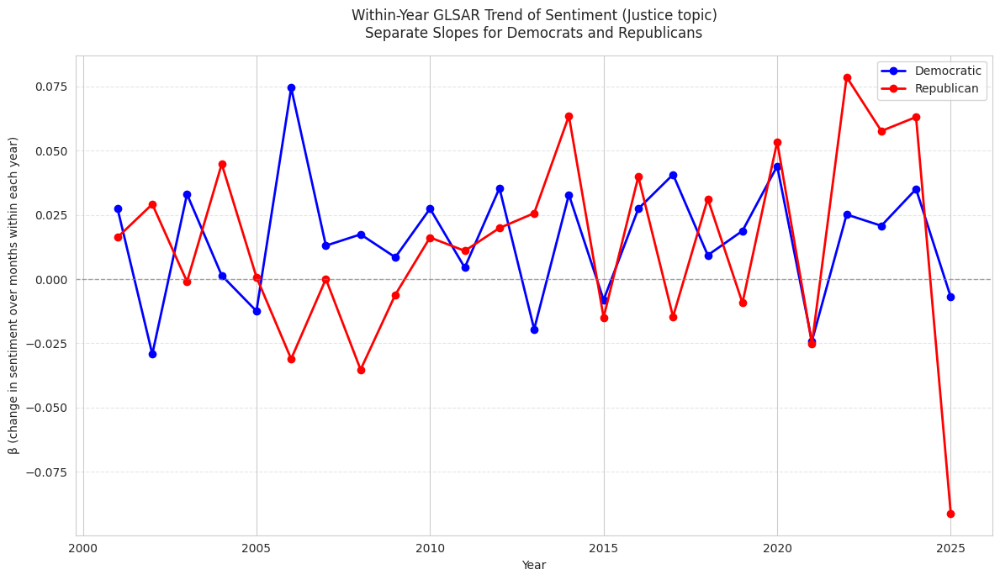

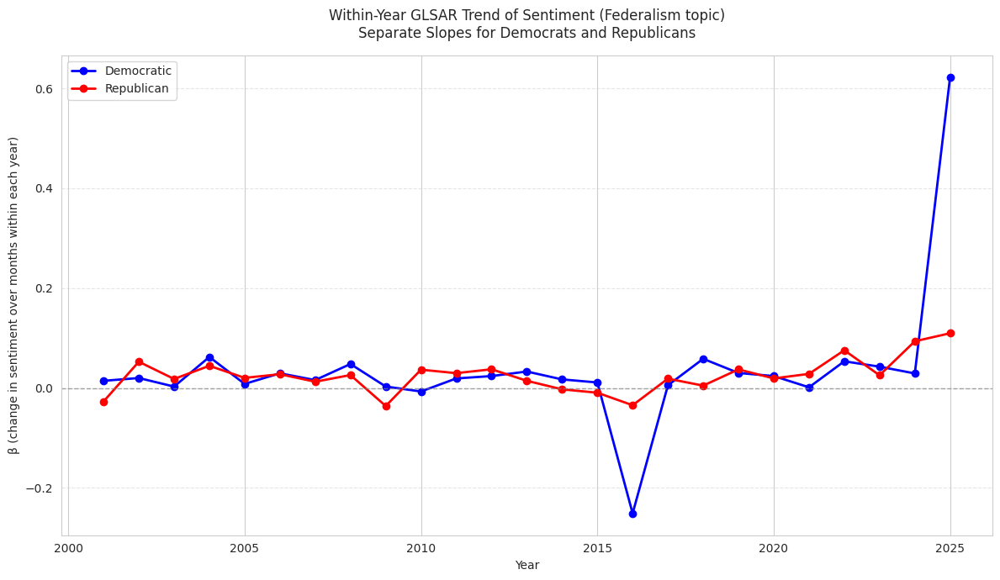

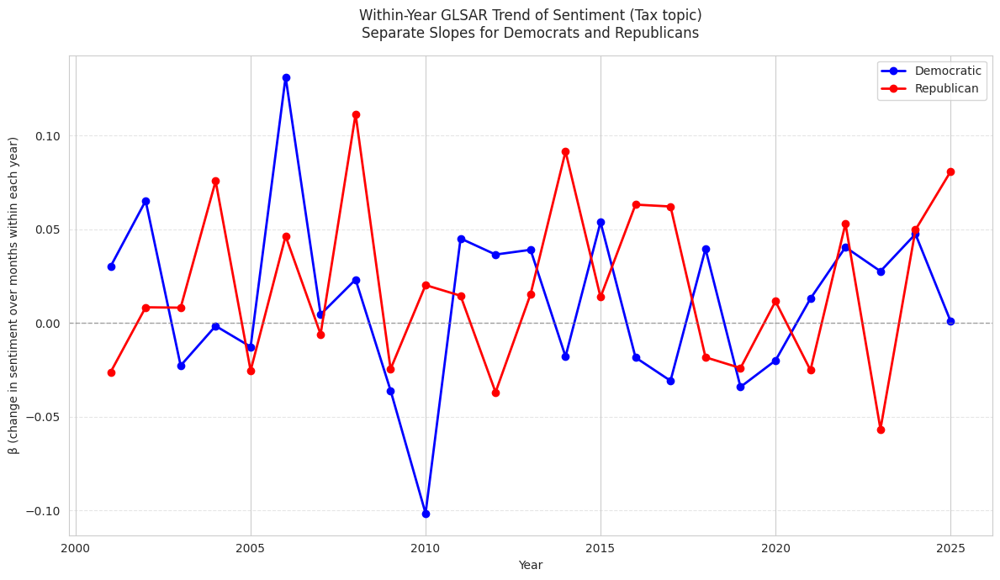

In [ ]:
import matplotlib.pyplot as plt

selected_topics2 = ['health', 'education', 'defense', 'justice', 'federalism', 'tax']

for topic in selected_topics2:
    df_topic = party_yearly_beta[
        party_yearly_beta[TOPIC_COL] == topic
    ].copy()

    if df_topic.empty:
        print(f"No data for topic: {topic}")
        continue

    plt.figure(figsize=(12, 7))

    for party, color in [('Democratic', 'blue'), ('Republican', 'red')]:
        s = df_topic[df_topic['party'] == party].dropna(subset=['beta_within_year'])
        s = s.sort_values('year')
        if s.empty:
            continue

        plt.plot(
            s['year'],
            s['beta_within_year'],
            marker='o',
            linewidth=2,
            label=party,
            color=color
        )

    plt.axhline(0, linestyle='--', linewidth=1, color='gray', alpha=0.7)

    plt.title(
        f'Within-Year GLSAR Trend of Sentiment ({topic.capitalize()} topic)\n'
        'Separate Slopes for Democrats and Republicans'
    )
    plt.xlabel('Year')
    plt.ylabel('β (change in sentiment over months within each year)')
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [ ]:
import statsmodels.api as sm
import numpy as np
import pandas as pd

required_cols = {'topic', 'congress', 'Democratic', 'Republican'}
missing = required_cols - set(meso_polar.columns)
if missing:
    raise ValueError(f"meso_polar is missing required columns: {missing}")

def run_glsar_trend(df_topic, y_col, x_col='congress', min_points=6, maxiter=10):
    """
    Fits GLSAR(AR1) of y_col ~ const + x_col for a single topic's time series.
    Returns dict with slope, p-value, adj R^2, and n_points. Returns NaNs if too few points.
    """
    s = df_topic[[x_col, y_col]].dropna().sort_values(x_col)
    if len(s) < min_points:
        return {'beta_congress': np.nan, 'p_value': np.nan, 'r2_adj': np.nan, 'n_points': len(s)}
    y = s[y_col].to_numpy()
    X = sm.add_constant(s[x_col].astype(float).to_numpy())
    mod = sm.GLSAR(y, X, rho=1)
    res = mod.iterative_fit(maxiter=maxiter)
    beta = res.params[1] if len(res.params) > 1 else np.nan
    pval = res.pvalues[1] if (hasattr(res, "pvalues") and len(res.pvalues) > 1) else np.nan
    r2a = res.rsquared_adj if hasattr(res, "rsquared_adj") else np.nan
    return {'beta_congress': beta, 'p_value': pval, 'r2_adj': r2a, 'n_points': len(s)}

topics = sorted(meso_polar['topic'].unique())

dem_rows = []
rep_rows = []

for t in topics:
    df_t = meso_polar[meso_polar['topic'] == t]

    dem_res = run_glsar_trend(df_t, y_col='Democratic')
    dem_rows.append({
        'topic': t,
        'beta_congress_dem': dem_res['beta_congress'],
        'p_value_dem': dem_res['p_value'],
        'r2_adj_dem': dem_res['r2_adj'],
        'n_points_dem': dem_res['n_points']
    })

    rep_res = run_glsar_trend(df_t, y_col='Republican')
    rep_rows.append({
        'topic': t,
        'beta_congress_rep': rep_res['beta_congress'],
        'p_value_rep': rep_res['p_value'],
        'r2_adj_rep': rep_res['r2_adj'],
        'n_points_rep': rep_res['n_points']
    })

dem_table = pd.DataFrame(dem_rows).sort_values('topic').reset_index(drop=True)
rep_table = pd.DataFrame(rep_rows).sort_values('topic').reset_index(drop=True)

compare_table = dem_table.merge(rep_table, on='topic', how='outer')

compare_table['beta_diff_dem_minus_rep'] = compare_table['beta_congress_dem'] - compare_table['beta_congress_rep']

compare_table = compare_table.sort_values(by='beta_diff_dem_minus_rep', key=lambda s: s.abs(), ascending=False)

pd.set_option('display.max_rows', None)
pd.set_option('display.width', 200)

print("\nDemocrats: GLSAR trend results (per topic)")
print(dem_table.to_string(index=False))

print("\nRepublicans: GLSAR trend results (per topic)")
print(rep_table.to_string(index=False))

print("\nComparison table: Democrats vs. Republicans (slope, p, R2, N) with slope difference")
print(compare_table[['topic',
                     'beta_congress_dem','p_value_dem','r2_adj_dem','n_points_dem',
                     'beta_congress_rep','p_value_rep','r2_adj_rep','n_points_rep',
                     'beta_diff_dem_minus_rep']].to_string(index=False))




Democrats: GLSAR trend results (per topic)
      topic  beta_congress_dem  p_value_dem  r2_adj_dem  n_points_dem
    alcohol              0.041        0.066       0.428             8
     budget             -0.001        0.982      -0.100            13
   business             -0.010        0.746      -0.088            13
      crime             -0.020        0.665      -0.078            13
    defense              0.025        0.167       0.100            13
    economy              0.009        0.787      -0.092            13
  education              0.030        0.238       0.050            13
  elections             -0.016        0.591      -0.067            13
environment              0.002        0.923      -0.099            13
 federalism             -0.019        0.506      -0.050            13
    foreign              0.031        0.249       0.043            13
 government              0.037        0.191       0.081            13
     health              0.007        0.840   

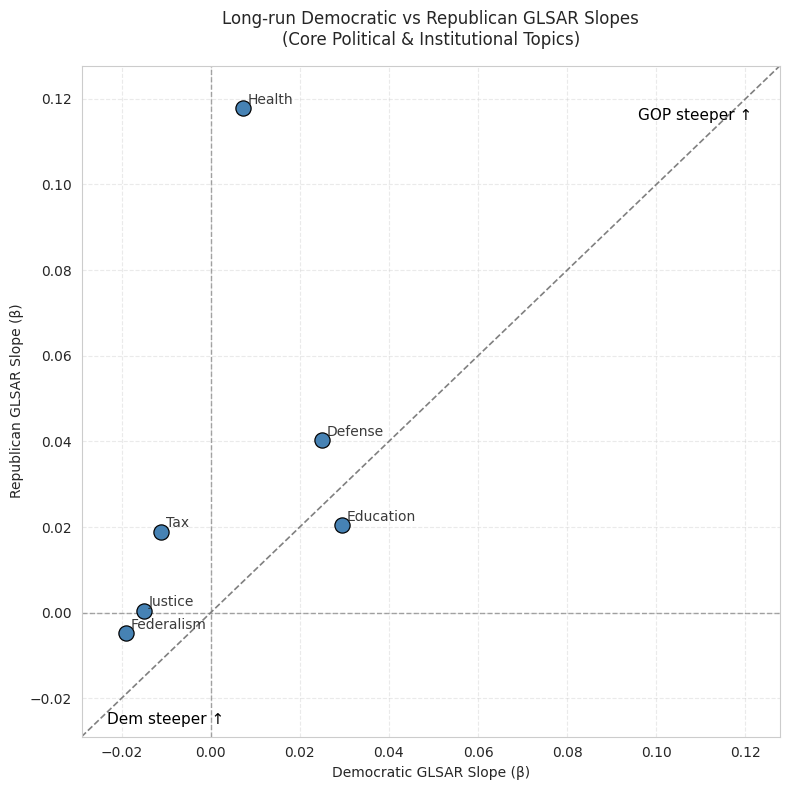

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_dem_rep_scatter_better(data, topic_list, title_text):
    subset = data[data['topic'].isin(topic_list)].copy()

    plt.figure(figsize=(8, 8))

    sns.scatterplot(
        x='beta_congress_dem',
        y='beta_congress_rep',
        data=subset,
        s=120,
        color='steelblue',
        edgecolor='black',
        zorder=3
    )

    for _, row in subset.iterrows():
        plt.text(
            row['beta_congress_dem'] + 0.001,
            row['beta_congress_rep'] + 0.001,
            row['topic'].capitalize(),
            fontsize=10,
            alpha=0.9
        )

    lims = [
        min(subset['beta_congress_dem'].min(), subset['beta_congress_rep'].min()) - 0.01,
        max(subset['beta_congress_dem'].max(), subset['beta_congress_rep'].max()) + 0.01
    ]
    plt.plot(lims, lims, '--', color='gray', linewidth=1.2, label='Dem = Rep', zorder=1)

    plt.xlim(lims)
    plt.ylim(lims)

    plt.axhline(0, linestyle='--', color='gray', linewidth=1, alpha=0.7)
    plt.axvline(0, linestyle='--', color='gray', linewidth=1, alpha=0.7)

    plt.xlabel('Democratic GLSAR Slope (β)')
    plt.ylabel('Republican GLSAR Slope (β)')
    plt.title(title_text)
    plt.grid(True, linestyle='--', alpha=0.4)

    plt.text(lims[1]*0.75, lims[1]*0.9, "GOP steeper ↑", fontsize=11, color='black')
    plt.text(lims[0]*0.8, lims[0]*0.9, "Dem steeper ↑", fontsize=11, color='black')

    plt.tight_layout()
    plt.show()


plot_dem_rep_scatter_better(
    compare_table,
    selected_topics2,
    'Long-run Democratic vs Republican GLSAR Slopes\n(Core Political & Institutional Topics)'
)